**Imports**

In [1]:
import numpy as np
import pandas as pd
import os
#import gc
import warnings

from numpy import corrcoef

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from darts import TimeSeries
from darts.dataprocessing.transformers.missing_values_filler import MissingValuesFiller
from darts.dataprocessing.transformers import Scaler

from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from darts.utils.statistics import plot_acf
from darts.utils.statistics import plot_pacf
from darts.utils.statistics import check_seasonality

#configuration
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

In [2]:
# Import
train = pd.read_csv("./data/train.csv")
# test = pd.read_csv("./data/test.csv")
# stores = pd.read_csv("./data/stores.csv")
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0


In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [4]:
train = train.drop('id', axis=1)

In [5]:
# Datetime
train["date"] = pd.to_datetime(train.date)
# test["date"] = pd.to_datetime(test.date)
# transactions["date"] = pd.to_datetime(transactions.date)

# Data types
#per il momento non cambiamo tipo perchè potrebbe dare problemi con modelli DARTS
# train.onpromotion = train.onpromotion.astype("float16")
# train.sales = train.sales.astype("float32")
# stores.cluster = stores.cluster.astype("int8")
train.tail()

,date,store_nbr,family,sales,onpromotion
3000883,2017-08-15,9,POULTRY,438.13,0
3000884,2017-08-15,9,PREPARED FOODS,154.55,1
3000885,2017-08-15,9,PRODUCE,2419.73,148
3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8
3000887,2017-08-15,9,SEAFOOD,16.00,0


In [6]:
print(f"Min timestamp = {train.date.min()}")
print(f"Max timestamp = {train.date.max()}")

Min timestamp = 2013-01-01 00:00:00
Max timestamp = 2017-08-15 00:00:00


In [7]:
# store_groups = train.groupby(["store_nbr"]).sum().reset_index()
# store_groups.tail()
train.shape

(3000888, 5)

In [8]:
print(f'{len(train["store_nbr"].unique())} stores and {len(train["family"].unique())} product classes')

54 stores and 33 product classes


In [9]:
# store_groups = train.groupby(["date", "store_nbr", "family"]).sum().reset_index()
# store_groups.tail()
#print(store_groups.shape)

In [10]:
family_groups = train.groupby(["date", "family"])['sales', 'onpromotion'].sum().reset_index()
family_groups.tail()

,date,family,sales,onpromotion
55567,2017-08-15,POULTRY,17586.71,6
55568,2017-08-15,PREPARED FOODS,4641.52,9
55569,2017-08-15,PRODUCE,125108.97,3169
55570,2017-08-15,SCHOOL AND OFFICE SUPPLIES,2530.00,148
55571,2017-08-15,SEAFOOD,970.18,0


In [11]:
total_family_groups = family_groups.groupby(["family"])['sales', 'onpromotion'].sum().reset_index()
total_family_groups.head()

,family,sales,onpromotion
0,AUTOMOTIVE,554822.00,4783
1,BABY CARE,10051.00,53
2,BEAUTY,337893.00,13483
3,BEVERAGES,216954486.00,906958
4,BOOKS,6438.00,0


In [12]:
total_family_groups.sort_values('sales', ascending=False).head(10)

,family,sales,onpromotion
12,GROCERY I,343462734.89,1914801
3,BEVERAGES,216954486.00,906958
30,PRODUCE,122704684.68,1117921
7,CLEANING,97521289.00,661157
8,DAIRY,64487709.00,728707
5,BREAD/BAKERY,42133945.58,331289
28,POULTRY,31876004.47,226421
24,MEATS,31086468.40,304028
25,PERSONAL CARE,24592051.00,246928
9,DELI,24110322.47,583316


In [13]:
total_family_groups.shape

(33, 3)

In [14]:
promo_sales_corr = round(corrcoef(total_family_groups['sales'], total_family_groups['onpromotion'])[1][0], 2)
promo_sales_corr

0.95

La correlazione tra sales e onpromotion delle categorie di prodotto è molto elevata.

In [245]:
#categorie = ['GROCERY I', 'BEVERAGES', 'CLEANING']
categorie = ['GROCERY I', 'BEVERAGES', 'PRODUCE']

Le 5 categorie di prodotto che hanno venduto di più sono: GROCERY I, BEVERAGES, PRODUCE, CLEANING, DAIRY

In [16]:
store_groups = train.groupby(["date", "store_nbr"]).sum().reset_index()
store_groups.tail()

,date,store_nbr,sales,onpromotion
90931,2017-08-15,50,16879.12,150
90932,2017-08-15,51,20154.56,127
90933,2017-08-15,52,18600.05,142
90934,2017-08-15,53,8208.19,114
90935,2017-08-15,54,12666.86,204


In [17]:
store_groups.loc[store_groups['sales'] == store_groups['sales'].max()]

,date,store_nbr,sales,onpromotion
65557,2016-05-02,2,136457.43,129


il record di vendite totali giornaliere appartiene allo store 2

In [18]:
store_groups.sort_values('sales', ascending=False).head(10)

,date,store_nbr,sales,onpromotion
65557,2016-05-02,2,136457.43,129
64981,2016-04-21,20,117725.10,155
64844,2016-04-18,45,114144.38,78
74126,2016-10-07,39,102862.54,271
64789,2016-04-17,44,90557.93,80
83581,2017-04-01,44,88183.51,126
78776,2017-01-02,45,85354.27,280
73861,2016-10-02,44,84398.83,225
78775,2017-01-02,44,83303.56,322
76129,2016-11-13,44,81774.12,309


Il record di vendite giornaliere assoluto è dello store 2, ma lo store 44 è quello maggiormente presente in top 10.

'onpromotion' può essere usato come covariata? Valutiamo la correlazione con 'sales'

In [19]:
promo_sales_corr = round(corrcoef(store_groups['sales'], store_groups['onpromotion'])[1][0], 2)
promo_sales_corr

0.36

la correlazione tra 'onpromotion' e 'sales' è non troppo elevata, potremmo calcolarla tra ogni top categoria di prodotto venduta ad ogni top store.

In [20]:
# promo_sales_corr = round(store_groups['sales'].corr(store_groups['onpromotion']), 2)
# promo_sales_corr

In [21]:
total_store_groups = store_groups.groupby(["store_nbr"])['sales', 'onpromotion'].sum().reset_index()
total_store_groups.head()

,store_nbr,sales,onpromotion
0,1,14145012.87,138020
1,2,21557388.64,158149
2,3,50481910.19,177075
3,4,18909700.38,151932
4,5,15592404.57,149370


In [22]:
promo_sales_corr = round(corrcoef(total_store_groups['sales'], total_store_groups['onpromotion'])[1][0], 2)
promo_sales_corr

0.75

In [23]:
total_store_groups.sort_values('sales', ascending=False).head(10)

,store_nbr,sales,onpromotion
43,44,62087553.25,192449
44,45,54498010.42,191503
46,47,50948310.06,192725
2,3,50481910.19,177075
48,49,43420095.78,184736
45,46,41896062.12,190697
47,48,35933130.27,185566
50,51,32911489.54,162576
7,8,30494286.93,169671
49,50,28653020.62,174115


I 5 negozi che hanno venduto di più sono 44, 45, 47, 3, 49

In [24]:
ds_stores_families = train.groupby(["store_nbr", "family"])['sales', 'onpromotion'].sum().reset_index()
ds_stores_families.head(10)

,store_nbr,family,sales,onpromotion
0,1,AUTOMOTIVE,5475.00,14
1,1,BABY CARE,0.00,0
2,1,BEAUTY,4056.00,226
3,1,BEVERAGES,2673769.00,15864
4,1,BOOKS,211.00,0
5,1,BREAD/BAKERY,569992.21,2925
6,1,CELEBRATION,16786.00,113
7,1,CLEANING,1078525.00,9384
8,1,DAIRY,1054354.00,9004
9,1,DELI,207037.08,9627


In [25]:
ds_stores_families.shape

(1782, 4)

In [26]:
ds_stores_families.sort_values('sales', ascending=False).head(10)

,store_nbr,family,sales,onpromotion
1431,44,GROCERY I,16386055.04,47188
1464,45,GROCERY I,16349751.29,46985
1530,47,GROCERY I,15514528.49,48215
1497,46,GROCERY I,14342262.00,47308
1422,44,BEVERAGES,13417859.00,23277
78,3,GROCERY I,12970467.97,41807
1563,48,GROCERY I,12830994.11,46979
1455,45,BEVERAGES,11370352.00,23708
69,3,BEVERAGES,11351589.00,21312
1596,49,GROCERY I,11087980.00,43408


In [27]:
ds_stores_families.loc[ds_stores_families['store_nbr'].isin([3, 44, 45, 46, 47, 48])
                       & ds_stores_families['family'].isin(['GROCERY I'])]\
                  .sort_values('sales', ascending=False)

,store_nbr,family,sales,onpromotion
1431,44,GROCERY I,16386055.04,47188
1464,45,GROCERY I,16349751.29,46985
1530,47,GROCERY I,15514528.49,48215
1497,46,GROCERY I,14342262.00,47308
78,3,GROCERY I,12970467.97,41807
1563,48,GROCERY I,12830994.11,46979


In [28]:
ds_stores_families.loc[ds_stores_families['family'].isin(['GROCERY I'])]\
                  .sort_values('sales', ascending=False).head(5)

,store_nbr,family,sales,onpromotion
1431,44,GROCERY I,16386055.04,47188
1464,45,GROCERY I,16349751.29,46985
1530,47,GROCERY I,15514528.49,48215
1497,46,GROCERY I,14342262.00,47308
78,3,GROCERY I,12970467.97,41807


In [29]:
top_five_categories = ['GROCERY I', 'BEVERAGES', 'PRODUCE', 'CLEANING', 'DAIRY']

In [30]:
def top_stores_percentage(category):
    top_stores_sum = ds_stores_families.loc[ds_stores_families['family'].isin([category]) &
                                            ds_stores_families['store_nbr'].isin([44, 45])]\
                      .sort_values('sales', ascending=False)['sales'].sum()
    total_category = total_family_groups.loc[total_family_groups['family'].isin([category])]['sales'].item()
    
    percentage = round(top_stores_sum / total_category, 2)
    return percentage

In [31]:
def top_five_percentage(category):
    top_5_sum = ds_stores_families.loc[ds_stores_families['family'].isin([category])]\
                      .sort_values('sales', ascending=False)\
                      .head(5)['sales'].sum()
    total_category = total_family_groups.loc[total_family_groups['family'].isin([category])]['sales'].item()
    
    percentage = round(top_5_sum / total_category, 2)
    return percentage

In [32]:
perc_dict = {}
perc_dict['family'] = top_five_categories
perc_dict['percentage'] = []

In [33]:
for i in top_five_categories:
    perc = top_five_percentage(i)
    perc_dict['percentage'].append(perc)
perc_dict

{'family': ['GROCERY I', 'BEVERAGES', 'PRODUCE', 'CLEANING', 'DAIRY'],
 'percentage': [0.22, 0.26, 0.33, 0.2, 0.28]}

In [34]:
df_percentage = pd.DataFrame(perc_dict)
df_percentage = df_percentage.sort_values('percentage', ascending=False).reset_index(drop = True)
df_percentage

,family,percentage
0,PRODUCE,0.33
1,DAIRY,0.28
2,BEVERAGES,0.26
3,GROCERY I,0.22
4,CLEANING,0.20


I primi 5 store in termini di vendite totali per ciascuna tipologia di prodotto (nel ds sopra si considerano le 5 tipologie più vendute in assoluto) pesano almeno il 20% fino a 1/3 per la categoria PRODUCE, delle vendite totali di tutti i 54 negozi.

In [35]:
perc_dict = {}
perc_dict['family'] = top_five_categories
perc_dict['percentage'] = []

for i in top_five_categories:
    perc = top_stores_percentage(i)
    perc_dict['percentage'].append(perc)
#perc_dict

df_percentage = pd.DataFrame(perc_dict)
df_percentage = df_percentage.sort_values('percentage', ascending=False).reset_index(drop = True)
df_percentage

,family,percentage
0,PRODUCE,0.14
1,DAIRY,0.12
2,BEVERAGES,0.11
3,GROCERY I,0.10
4,CLEANING,0.09


Gli store 44 e 45, i primi due store in termini di vendite in assoluto, pesano nelle vendite assolute di ciascuna tipologia di prodotto (più vendute in assoluto) almeno il 9% (fino al 14% per la categoria PRODUCE), delle vendite ottenute da tutti i 54 negozi.

In [36]:
#total_beverages = total_family_groups.loc[total_family_groups['family'].isin(['BEVERAGES'])]['sales'].item()
#total_beverages = total_family_groups.query("family == 'BEVERAGES'")['sales'].item()
#total_beverages

In [37]:
top_five_stores_dict = {}

In [38]:
for i in top_five_categories:
    top_stores = ds_stores_families.loc[ds_stores_families['family'].isin([i])]\
                      .sort_values('sales', ascending=False).head(5)['store_nbr'].to_list()
    top_five_stores_dict[i] = top_stores

top_five_stores_dict

{'GROCERY I': [44, 45, 47, 46, 3],
 'BEVERAGES': [44, 45, 3, 47, 49],
 'PRODUCE': [44, 3, 49, 45, 47],
 'CLEANING': [44, 45, 47, 46, 48],
 'DAIRY': [44, 45, 3, 47, 49]}

In [39]:
df_top_stores = pd.DataFrame(top_five_stores_dict)
df_top_stores

,GROCERY I,BEVERAGES,PRODUCE,CLEANING,DAIRY
0,44,44,44,44,44
1,45,45,3,45,45
2,47,3,49,47,3
3,46,47,45,46,47
4,3,49,47,48,49


In [40]:
absolute_top_stores = set.intersection(*(set(val) for val in top_five_stores_dict.values()))
absolute_top_stores

{44, 45, 47}

Gli store 44, 45, 47 sono gli unici che si trovano tra i top 5 store di ciascuna delle top 5 categorie di prodotto e lo store 44 è il migliore per ogni categoria top 5, come si vede dal dataset sopra.

quanto pesa lo store 44 sulle vendite assolute delle 5 categorie di prodotti principali?

In [41]:
def top_store_percentage(category):
#     top_record = ds_stores_families.loc[ds_stores_families['family'].isin([category])]\
#                       .sort_values('sales', ascending=False)\
#                       .head(1)
    top_sale = ds_stores_families.loc[ds_stores_families['family'].isin([category])]['sales'].max()
    top_record = ds_stores_families.loc[ds_stores_families["sales"] == top_sale,]
    
    top_store = top_record['store_nbr'].item()
    #top_name = top_record['store_nbr'].item()
    #print(category, top_store, top_sale)
    total_category = total_family_groups.loc[total_family_groups['family'].isin([category])]['sales'].item()
    
    percentage = round(top_sale / total_category, 2)
    return top_store, percentage

In [42]:
top_store_perc_dict = {}
top_store_perc_dict['family'] = top_five_categories
top_store_perc_dict['percentage'] = []
top_store_perc_dict['store'] = []

for i in top_five_categories:
    store, top_percentage = top_store_percentage(category=i)
    top_store_perc_dict['percentage'].append(top_percentage)
    top_store_perc_dict['store'].append(store)

top_store_perc_dict

{'family': ['GROCERY I', 'BEVERAGES', 'PRODUCE', 'CLEANING', 'DAIRY'],
 'percentage': [0.05, 0.06, 0.09, 0.04, 0.07],
 'store': [44, 44, 44, 44, 44]}

In [43]:
df_top_store = pd.DataFrame(top_store_perc_dict)
df_top_store = df_top_store.sort_values('percentage', ascending=False).reset_index(drop = True)
df_top_store

,family,percentage,store
0,PRODUCE,0.09,44
1,DAIRY,0.07,44
2,BEVERAGES,0.06,44
3,GROCERY I,0.05,44
4,CLEANING,0.04,44


lo store 44 vale addirittura il 9% delle vendite totali di PRODUCE e il 5% di GROCERY I.

Se tutti gli store pesassero uguale, peserebbero per il 3%, ciò vuol dire che lo store 44 pesa mediamente come 3 negozi.

**CREAZIONE SERIE STORICHE DEI SOLI TOP 2 STORE PER LE TOP 3 CATEGORIE DI PRODOTTO**

In [44]:
#provare anche top 7 store: 3, 44, 45, 46, 47, 48, 49

# partial_train = train.loc[train['store_nbr'].isin([44, 45, 47])
#                           & train['family'].isin(top_five_categories)]
# partial_train.head(15)

In [246]:
categorie

['GROCERY I', 'BEVERAGES', 'PRODUCE']

**partial train finale**

In [247]:
partial_train = train.loc[train['store_nbr'].isin([44, 45])
                          & train['family'].isin(categorie)]
partial_train.head(15)

,date,store_nbr,family,sales,onpromotion
1257,2013-01-01,44,BEVERAGES,0.00,0
1266,2013-01-01,44,GROCERY I,0.00,0
1284,2013-01-01,44,PRODUCE,0.00,0
1290,2013-01-01,45,BEVERAGES,0.00,0
1299,2013-01-01,45,GROCERY I,0.00,0
1317,2013-01-01,45,PRODUCE,0.00,0
3039,2013-01-02,44,BEVERAGES,5466.00,0
3048,2013-01-02,44,GROCERY I,10686.00,0
3066,2013-01-02,44,PRODUCE,0.00,0
3072,2013-01-02,45,BEVERAGES,4070.00,0


In [248]:
top_series = pd.pivot_table(data=partial_train, index="date", columns=["store_nbr","family"] , values="sales")
top_series

store_nbr         44                           45                  
family     BEVERAGES GROCERY I  PRODUCE BEVERAGES GROCERY I PRODUCE
date                                                               
2013-01-01      0.00      0.00     0.00      0.00      0.00    0.00
2013-01-02   5466.00  10686.00     0.00   4070.00  11422.00    0.00
2013-01-03   3718.00   7342.00     0.00   2526.00   6841.00    0.00
2013-01-04   4112.00   7250.00     0.00   3064.00   7527.00    0.00
2013-01-05   6458.00  10699.00     0.00   4852.00  10550.00    0.00
...              ...       ...      ...       ...       ...     ...
2017-08-11   9517.00   9979.00  9311.46   8983.00  11088.00 7112.93
2017-08-12   9624.00   9391.00  9153.44   8969.00   9917.00 6242.68
2017-08-13  10491.00   9811.00 11201.80  10671.00  12723.00 7621.85
2017-08-14   7322.00   8318.00  8735.74   7639.00   9665.00 6380.62
2017-08-15   7351.00   8123.00  7239.62   6805.00   9287.00 4973.19

[1684 rows x 6 columns]

In [249]:
import re
def clean_column_name(column):
    merged_column = ''.join(str(column))
    clean_column = re.sub(r'\W+', " ", merged_column)
    return clean_column.strip()

In [250]:
top_series.columns = top_series.columns.map(lambda x: clean_column_name(x))

In [251]:
top_series.head(5)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
date,,,,,,
2013-01-01,0.00,0.00,0.00,0.00,0.00,0.00
2013-01-02,5466.00,10686.00,0.00,4070.00,11422.00,0.00
2013-01-03,3718.00,7342.00,0.00,2526.00,6841.00,0.00
2013-01-04,4112.00,7250.00,0.00,3064.00,7527.00,0.00
2013-01-05,6458.00,10699.00,0.00,4852.00,10550.00,0.00


In [615]:
#top_series.to_csv('./data/top_series_train.csv')
top_series = pd.read_csv('./data/top_series_train.csv')
top_series["date"] = pd.to_datetime(top_series.date)
top_series.set_index(keys='date', inplace=True)
top_series.head(2)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
date,,,,,,
2013-01-01,0.00,0.00,0.00,0.00,0.00,0.00
2013-01-02,5466.00,10686.00,0.00,4070.00,11422.00,0.00


In [501]:
top_series.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1684 entries, 2013-01-01 to 2017-08-15
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   44 BEVERAGES  1684 non-null   float64
 1   44 GROCERY I  1684 non-null   float64
 2   44 PRODUCE    1684 non-null   float64
 3   45 BEVERAGES  1684 non-null   float64
 4   45 GROCERY I  1684 non-null   float64
 5   45 PRODUCE    1684 non-null   float64
dtypes: float64(6)
memory usage: 92.1 KB


**creazione dataset top series dei valori 'onpromotion'**

In [55]:
top_series_promo = pd.pivot_table(data=partial_train, index="date", columns=["store_nbr","family"] , values="onpromotion")

In [56]:
top_series_promo.columns = top_series_promo.columns.map(lambda x: clean_column_name(x))

In [57]:
#top_series_promo.to_csv('./data/top_series_promo.csv')

In [58]:
top_series_promo = pd.read_csv('./data/top_series_promo.csv', index_col='date', parse_dates=True)

In [59]:
top_series_promo.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1684 entries, 2013-01-01 to 2017-08-15
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   44 BEVERAGES  1684 non-null   int64
 1   44 GROCERY I  1684 non-null   int64
 2   44 PRODUCE    1684 non-null   int64
 3   45 BEVERAGES  1684 non-null   int64
 4   45 GROCERY I  1684 non-null   int64
 5   45 PRODUCE    1684 non-null   int64
dtypes: int64(6)
memory usage: 92.1 KB


In [60]:
top_series_promo.tail(2)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
date,,,,,,
2017-08-14,12,39,10,10,39,8
2017-08-15,12,37,10,13,35,9


<AxesSubplot: xlabel='date'>

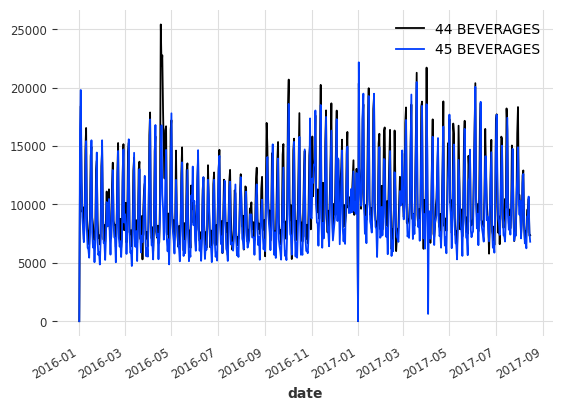

In [256]:
top_series.loc['2016-01-01':, ['44 BEVERAGES',
  '45 BEVERAGES']].plot()

In [83]:
series_ds.sum().sort_values(ascending=False).head(10)

44 GROCERY I   16386055.04
45 GROCERY I   16349751.29
47 GROCERY I   15514528.49
46 GROCERY I   14342262.00
44 BEVERAGES   13417859.00
3 GROCERY I    12970467.97
48 GROCERY I   12830994.11
45 BEVERAGES   11370352.00
3 BEVERAGES    11351589.00
49 GROCERY I   11087980.00
dtype: float64

categorie prodotti più presenti: GROCERY I, BEVERAGES, PRODUCE

stores più attivi: 44, 45, 46, 47, 48, 3
questi stores sono tutti a Quito

In [68]:
stores = pd.read_csv("./data/stores.csv")
stores.head(2)

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13


In [85]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [86]:
stores.loc[stores['store_nbr'].isin([3, 44, 45, 46, 47, 48])]
#capire cosa vuol dire 'type': indica la tipologia ma non meglio specificato su Kaggle

,store_nbr,city,state,type,cluster
2,3,Quito,Pichincha,D,8
43,44,Quito,Pichincha,A,5
44,45,Quito,Pichincha,A,11
45,46,Quito,Pichincha,A,14
46,47,Quito,Pichincha,A,14
47,48,Quito,Pichincha,A,14


In [87]:
series_ds.loc[series_ds["44 GROCERY I"] == series_ds["44 GROCERY I"].max(), "44 GROCERY I"]

date
2013-11-12   46271.00
Name: 44 GROCERY I, dtype: float64

<AxesSubplot: xlabel='date'>

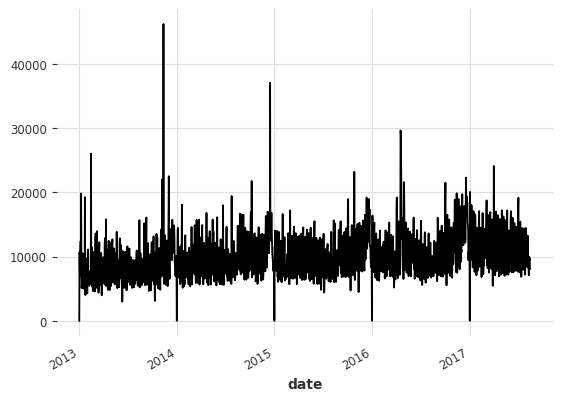

In [88]:
series_ds["44 GROCERY I"].plot()

Si nota che le vendite sono pari a zero il primo di ogni anno, questo potrebbe falsare un po' l'autocorrelazione e la stagionalità, si potrebbero aggregare le serie storiche settimanalmente

nota da kaggle: A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water
and other first need products which greatly affected supermarket sales for several weeks after the earthquake

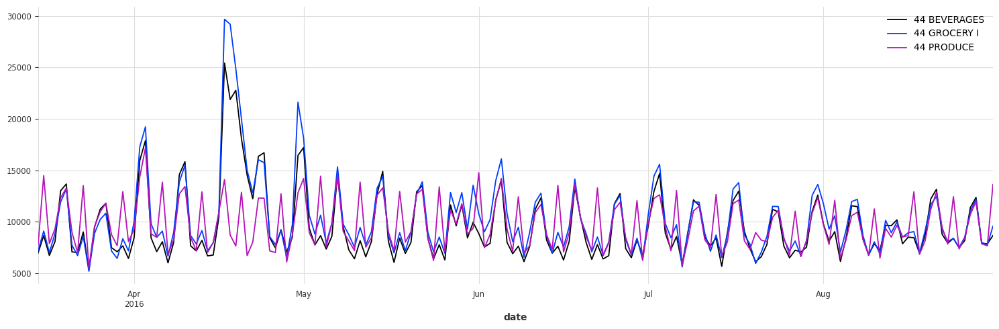

In [257]:
fig, ax = plt.subplots(figsize=(15, 5))
top_series.loc['2016-03-15':'2016-08-31', ['44 BEVERAGES',
  '44 GROCERY I', '44 PRODUCE']].plot(ax=ax)
plt.tight_layout()
plt.show()

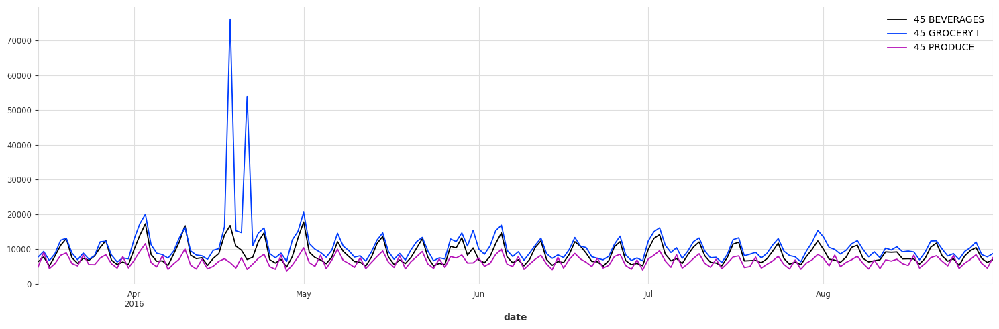

In [258]:
fig, ax = plt.subplots(figsize=(15, 5))
top_series.loc['2016-03-15':'2016-08-31', ['45 BEVERAGES',
  '45 GROCERY I', '45 PRODUCE']].plot(ax=ax)
plt.tight_layout()
plt.show()

Si può notare un picco di vendite assolutamente fuori dalla distribuzione dei valori circostanti, intorno alla data del terremoto

In [97]:
store_total_sales = pd.pivot_table(data=train, index="date", columns="store_nbr", values="sales", aggfunc="sum")
store_total_sales['total'] = store_total_sales.sum(axis=1)
store_total_sales.head(5)

store_nbr,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,total
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2511.62,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2511.62
2013-01-02,7417.15,10266.72,24060.35,10200.08,10598.62,13520.49,11997.50,14659.33,15867.48,5430.09,18329.64,5854.52,5516.83,7698.25,6577.81,6242.57,7673.51,8204.57,5615.39,0.00,0.00,0.00,6560.34,11018.85,5316.22,5653.41,7207.55,5176.47,0.00,2623.01,6637.56,2441.51,5720.77,7749.69,2978.22,0.00,11111.84,9198.51,9956.37,4965.01,5205.83,0.00,6054.34,30095.18,27612.05,27149.92,27263.11,19700.00,16281.84,16576.13,15134.49,0.00,0.00,4973.28,496092.42
2013-01-03,5873.24,7612.54,18570.75,7400.24,7770.97,9929.39,9277.96,10781.24,10431.72,4549.53,12356.21,4460.16,4852.44,6158.58,5691.45,5316.41,5523.24,5107.04,3783.09,0.00,0.00,0.00,4911.20,10086.24,4442.91,3477.56,4387.57,4142.30,0.00,2538.32,5437.83,2589.70,5167.40,6246.72,2699.28,0.00,9335.66,7860.62,6986.44,4484.83,3699.12,0.00,5206.78,20447.06,17377.98,15751.35,18340.20,14350.78,9909.08,11066.47,11170.06,0.00,0.00,3901.57,361461.23
2013-01-04,5919.88,7526.38,17392.10,6902.05,7347.64,8869.21,8096.57,11124.65,8085.16,3381.02,12172.00,3684.05,4249.48,5777.69,4825.65,4616.99,5239.57,4033.75,3233.50,0.00,0.00,0.00,5620.53,10059.48,4844.35,3538.45,4586.47,2615.64,0.00,1987.33,6107.64,2705.50,4282.11,6100.12,2406.93,0.00,8954.49,7433.77,5605.50,3838.03,3581.13,0.00,5499.70,22795.80,19936.20,17073.06,18982.01,15276.80,10284.57,12147.44,12452.33,0.00,0.00,3266.97,354459.68
2013-01-05,6318.79,9539.57,22700.87,9948.38,8192.60,12431.69,8610.61,14277.70,13057.11,5409.79,14763.05,4818.67,6465.23,7974.62,5694.06,6014.65,7557.55,6510.64,6363.82,0.00,0.00,0.00,6041.00,12031.91,5817.53,5503.19,6731.61,5939.63,0.00,2811.19,5875.19,2623.64,5981.78,7189.41,2981.36,0.00,11268.07,9842.55,9256.67,5314.73,4694.56,0.00,4328.89,31382.51,27104.22,27231.20,26996.26,22876.47,13506.02,17930.36,15046.25,0.00,0.00,4394.55,477350.12


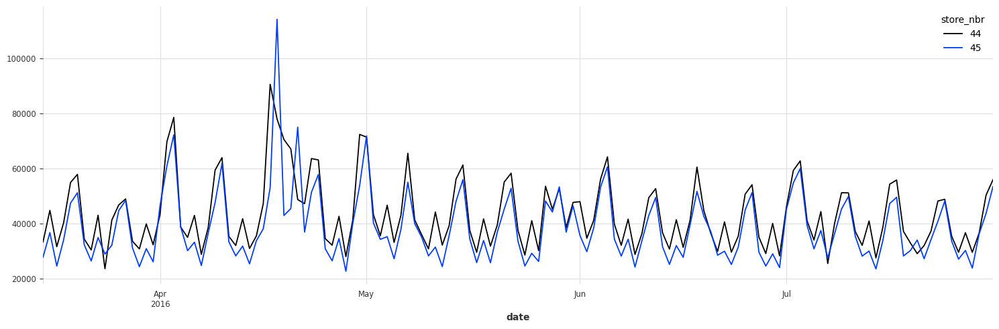

In [103]:
fig, ax = plt.subplots(figsize=(15, 5))
store_total_sales.loc['2016-03-15':'2016-07-31', [44,
  45]].plot(ax=ax)
plt.tight_layout()
plt.show()

Anche nelle vendite totali dei negozi si possono notare picchi in prossimità della data del terremoto

In [98]:
store_total_sales.sum().sort_values(ascending=False).head(10)

store_nbr
total   1073644952.20
44        62087553.25
45        54498010.42
47        50948310.06
3         50481910.19
49        43420095.78
46        41896062.12
48        35933130.27
51        32911489.54
8         30494286.93
dtype: float64

creiamo la tabella del totale delle vendite giornaliero per ogni categoria di prodotto

In [99]:
families_total_sales = pd.pivot_table(data=train, index="date", columns="family", values="sales", aggfunc="sum")
families_total_sales['total'] = families_total_sales.sum(axis=1)
families_total_sales.head(5)

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD,total
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0.00,0.00,2.00,810.00,0.00,180.59,0.00,186.00,143.00,71.09,46.00,29.65,700.00,15.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,5.00,105.00,0.00,110.80,25.00,0.00,0.00,42.64,37.85,0.00,0.00,0.00,2511.62
2013-01-02,255.00,0.00,207.00,72092.00,0.00,26246.32,0.00,74629.00,23381.00,15754.50,10932.00,7115.39,202020.00,1476.00,46.00,0.00,0.00,21.00,0.00,0.00,121.00,469.00,2411.00,0.00,20871.46,17204.00,0.00,0.00,13975.88,5338.11,0.00,0.00,1526.75,496092.42
2013-01-03,161.00,0.00,125.00,52105.00,0.00,18456.48,0.00,55893.00,18001.00,11172.45,7358.00,4760.81,144878.00,1048.00,37.00,0.00,0.00,15.00,0.00,0.00,83.00,366.00,2476.00,0.00,16597.40,12568.00,0.00,0.00,10674.39,3591.39,0.00,0.00,1094.31,361461.23
2013-01-04,169.00,0.00,133.00,54167.00,0.00,16721.97,0.00,52064.00,18148.00,10143.21,6760.00,4525.93,135754.00,1031.00,57.00,0.00,0.00,13.00,0.00,0.00,127.00,382.00,4796.00,0.00,21625.96,11303.00,0.00,0.00,10772.52,4472.97,0.00,0.00,1293.12,354459.68
2013-01-05,342.00,0.00,191.00,77818.00,0.00,22367.76,0.00,70128.00,23082.00,13734.95,8576.00,5781.61,188356.00,1273.00,87.00,0.00,0.00,11.00,0.00,0.00,180.00,458.00,6715.00,0.00,20879.09,16819.00,0.00,0.00,13475.01,5830.07,0.00,0.00,1245.64,477350.12


In [100]:
abs_total_family = families_total_sales.sum().sort_values(ascending=False).head(10)
abs_total_family

family
total           1073644952.20
GROCERY I        343462734.89
BEVERAGES        216954486.00
PRODUCE          122704684.68
CLEANING          97521289.00
DAIRY             64487709.00
BREAD/BAKERY      42133945.58
POULTRY           31876004.47
MEATS             31086468.40
PERSONAL CARE     24592051.00
dtype: float64

In [101]:
type(abs_total_family)

pandas.core.series.Series

Calcolare percentuale GROCERY I, BEVERAGES, PRODUCE, CLEANING, DAIRY sul totale

**PRE-PROCESSING TEST SET**

In [55]:
test = pd.read_csv("./data/test.csv")
test.head(5)

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [50]:
test = test.drop('id', axis=1)
test["date"] = pd.to_datetime(test.date)

In [51]:
print(f"Min timestamp = {test.date.min()}")
print(f"Max timestamp = {test.date.max()}")

Min timestamp = 2017-08-16 00:00:00
Max timestamp = 2017-08-31 00:00:00


il test set considera solo gli ultimi 16 giorni, valutare se considerare almeno un mese.

In [104]:
partial_test = test.loc[test['store_nbr'].isin([44, 45, 47])
                          & test['family'].isin(top_five_categories)]
partial_test.head(5)

,id,date,store_nbr,family,onpromotion
1257,3002145,2017-08-16,44,BEVERAGES,23
1261,3002149,2017-08-16,44,CLEANING,21
1262,3002150,2017-08-16,44,DAIRY,38
1266,3002154,2017-08-16,44,GROCERY I,56
1284,3002172,2017-08-16,44,PRODUCE,255


sono assenti i valori di 'sales' per il test, dobbiamo usare almeno l'ultimo mese di train come test

In [56]:
top_test_series = pd.pivot_table(data=partial_test, index="date", columns=["store_nbr","family"] , values="onpromotion")
top_test_series.head(5)

store_nbr         44                                         45           \
family     BEVERAGES CLEANING DAIRY GROCERY I PRODUCE BEVERAGES CLEANING   
date                                                                       
2017-08-16        23       21    38        56     255        24       22   
2017-08-17        19       11    19        40       5        18       12   
2017-08-18        19       14    22        40       5        18       13   
2017-08-19        19       14    22        38       5        18       10   
2017-08-20        18       14    22        40       5        18       11   

store_nbr                                 47                                   
family     DAIRY GROCERY I PRODUCE BEVERAGES CLEANING DAIRY GROCERY I PRODUCE  
date                                                                           
2017-08-16    40        59     256        22       20    36        56     256  
2017-08-17    16        41       5        18       12    18        41       4  
2017-08-18    21        41       5        19       12    22        40       5  
2017-08-19    21        42       7        15       14    22        42       5  
2017-08-20    22        38       6        18       11    22        41       4

Dato che i valori di sales sono assenti nel test set utilizzeremo l'ultima parte del train set come test

**Correlazione tra le top serie storiche**

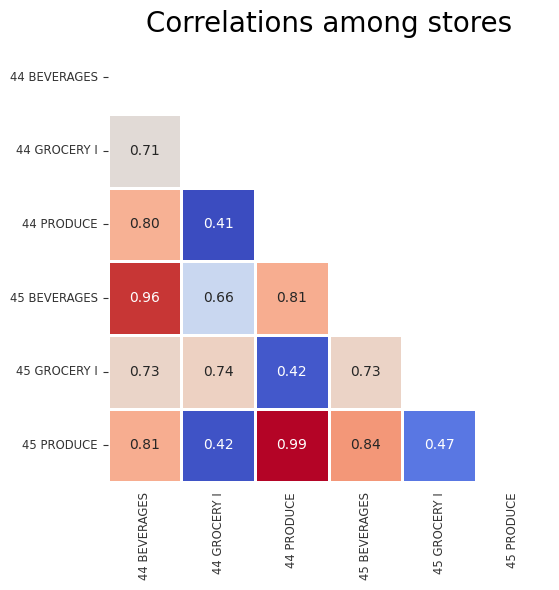

In [259]:
cor = top_series.corr() #tabella a doppia entrata delle correlazioni
mask = np.triu(cor)#.corr())??? #mask è la matrice delle correlazioni
plt.figure(figsize=(6, 6))
sns.heatmap(cor,
        annot=True,
        fmt='.2f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores", fontsize=20)
plt.tight_layout()
plt.show()

Tra le serie storiche ci sono correlazioni elevatissime, anche 0.99 come tra '44 PRODUCE' e '45 PRODUCE'.
Bisogna capire se c'è elevata correlazione anche tra '44 PRODUCE' e i lag di '45 PRODUCE' e viceversa per poterle usare come covariate in maniera proficua.

In [80]:
lag_1_45_produce = top_series['45 PRODUCE'].shift(1)[1:]
lag_1_45_produce[:5]

date
2013-01-02   0.00
2013-01-03   0.00
2013-01-04   0.00
2013-01-05   0.00
2013-01-06   0.00
Name: 45 PRODUCE, dtype: float64

In [81]:
top_series['45 PRODUCE'][:5]

date
2013-01-01   0.00
2013-01-02   0.00
2013-01-03   0.00
2013-01-04   0.00
2013-01-05   0.00
Name: 45 PRODUCE, dtype: float64

In [83]:
produce_44_45_lag_corr = round(corrcoef(top_series['44 PRODUCE'][1:], lag_1_45_produce)[1][0], 2)
produce_44_45_lag_corr

0.81

La correlazione tra '44 PRODUCE' e la serie con un lag di un giorno di '45 PRODUCE' rimane molto elevata a 0.81, possiamo usare la serie laggata come covariata nei modelli predittivi.

**ANALISI STAZIONARIETA'**

In [2]:
from statsmodels.tsa.stattools import adfuller, kpss

In [132]:
def adf_test(timeseries):
    """
    Takes a Pandas Series as input and calculate its ADF test values.

    Parameters
    ----------
    timeseries: Pandas Series 

    Returns
    -------
    None

    """
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, regression='c', autolag='t-stat', maxlag=370)
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

In [133]:
def kpss_test(timeseries):
    """
    Takes a Pandas Series as input and calculate its KPSS test values.

    Parameters
    ----------
    timeseries: Pandas Series 

    Returns
    -------
    None

    """
    print ('Results of KPSS Test:')
    kpsstest = kpss(timeseries, regression='c', nlags='auto')
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','#Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    return kpss_output

ipotesi nulla adf: la serie è NON STAZIONARIA

ipotesi nulla kpss: la serie è STAZIONARIA

In [90]:
adf_test(top_series['44 BEVERAGES'])

Results of Dickey-Fuller Test:
Test Statistic                  -3.01
p-value                          0.03
#Lags Used                      22.00
Number of Observations Used   1661.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64


La serie 44 BEVERAGES è STAZIONARIA secondo il test adf

In [91]:
kpss_test(top_series['44 BEVERAGES'])

Results of KPSS Test:
Test Statistic          0.37
p-value                 0.01
#Lags Used              6.00
Critical Value (10%)    0.12
Critical Value (5%)     0.15
Critical Value (2.5%)   0.18
Critical Value (1%)     0.22
dtype: float64


La serie 44 BEVERAGES è NON STAZIONARIA secondo il test kpss

A questo punto è preferibile differenziare la serie storica per renderla stazionaria, modelli predittivi della famiglia ARIMA
gioveranno della differenziazione.

**INIZIO ANALISI SERIE STORICHE**

In [105]:
#top_series = top_series.set_index('date')
top_series['44 BEVERAGES']

date
2013-01-01       0.00
2013-01-02    5466.00
2013-01-03    3718.00
2013-01-04    4112.00
2013-01-05    6458.00
               ...   
2017-08-11    9517.00
2017-08-12    9624.00
2017-08-13   10491.00
2017-08-14    7322.00
2017-08-15    7351.00
Name: 44 BEVERAGES, Length: 1684, dtype: float64

In [106]:
top_series['44 BEVERAGES'].describe()

count    1684.00
mean     7967.85
std      3885.07
min         0.00
25%      4618.25
50%      7585.50
75%      9608.75
max     25413.00
Name: 44 BEVERAGES, dtype: float64

In [93]:
beverages_44_diff = top_series['44 BEVERAGES'].diff(1)[1:]
beverages_44_diff[:5]

date
2013-01-02    5466.00
2013-01-03   -1748.00
2013-01-04     394.00
2013-01-05    2346.00
2013-01-06    1481.00
Name: 44 BEVERAGES, dtype: float64

In [94]:
adf_test(beverages_44_diff)

Results of Dickey-Fuller Test:
Test Statistic                  -9.97
p-value                          0.00
#Lags Used                      25.00
Number of Observations Used   1657.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64


La serie differenziata di un periodo è stazionaria secondo adf test

In [95]:
kpss_test(beverages_44_diff)

Results of KPSS Test:
Test Statistic           0.02
p-value                  0.10
#Lags Used              52.00
Critical Value (10%)     0.12
Critical Value (5%)      0.15
Critical Value (2.5%)    0.18
Critical Value (1%)      0.22
dtype: float64


La serie differenziata di un periodo è stazionaria secondo kpss test

In [61]:
beverages_44_diff['2016':].plot()

NameError: name 'beverages_44_diff' is not defined

In [98]:
aut_corr = acf(x=beverages_44_diff, nlags=100)

In [99]:
lags_aut = [(i+1, round(c, 3)) for i, c in enumerate(aut_corr[1:]) if abs(c) > 0.35] #0.051
lags_aut

[(2, -0.424),
 (5, -0.365),
 (7, 0.694),
 (9, -0.385),
 (14, 0.654),
 (16, -0.374),
 (19, -0.351),
 (21, 0.613),
 (23, -0.366),
 (28, 0.601),
 (35, 0.583),
 (42, 0.576),
 (49, 0.572),
 (56, 0.556),
 (63, 0.536),
 (70, 0.5),
 (77, 0.493),
 (84, 0.441),
 (91, 0.441),
 (98, 0.401)]

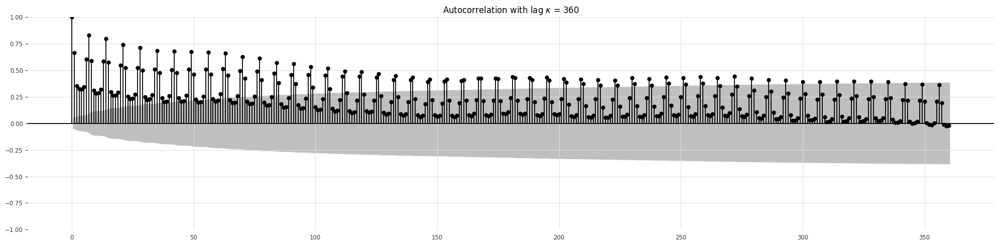

In [112]:
from statsmodels.graphics.tsaplots import plot_acf
#plot_acf(top_series['44 BEVERAGES'], lags=400, alpha=0.05) #m=500, max_lag=600
fig, ax = plt.subplots(figsize=(20, 5))
plot_acf(x=top_series['44 BEVERAGES'], ax=ax, lags=360, alpha=0.05)
plt.title(r'Autocorrelation with lag $\kappa$ = 360')
plt.tight_layout()
plt.show()

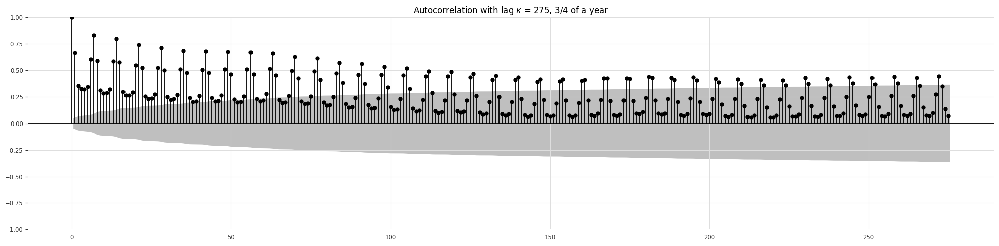

In [113]:
fig, ax = plt.subplots(figsize=(20, 5))
plot_acf(x=top_series['44 BEVERAGES'], ax=ax, lags=275, alpha=0.05)
plt.title(r'Autocorrelation with lag $\kappa$ = 275, 3/4 of a year')
plt.tight_layout()
plt.show()

il grafico dell'autocorrelazione mostra un andamento estremamente cadenzato con un periodo settimanale, si potrebbe valutare di usare una frequenza settimanale della serie storica o specificare quali lag usare a intervalli di -7, a partire da -6 (fino a lag 272), -7 (fino a lag 252), -8 (fino a lag 106) giorni nel modello ARIMA o altri modelli.

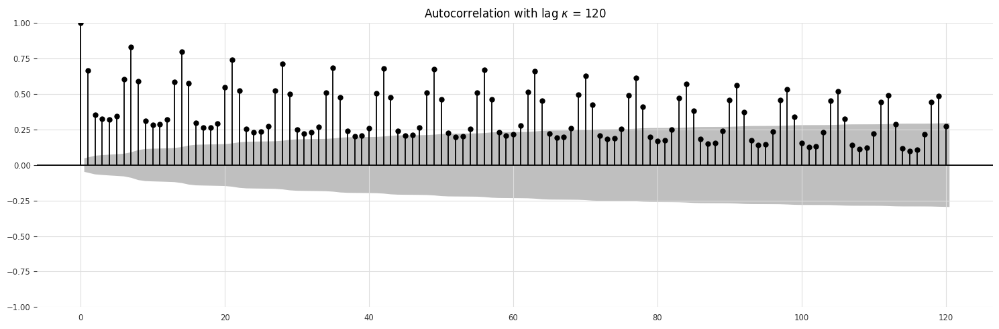

In [114]:
fig, ax = plt.subplots(figsize=(15, 5))
plot_acf(x=top_series['44 BEVERAGES'], ax=ax, lags=120, alpha=0.05)
plt.title(r'Autocorrelation with lag $\kappa$ = 120')
plt.tight_layout()
plt.show()

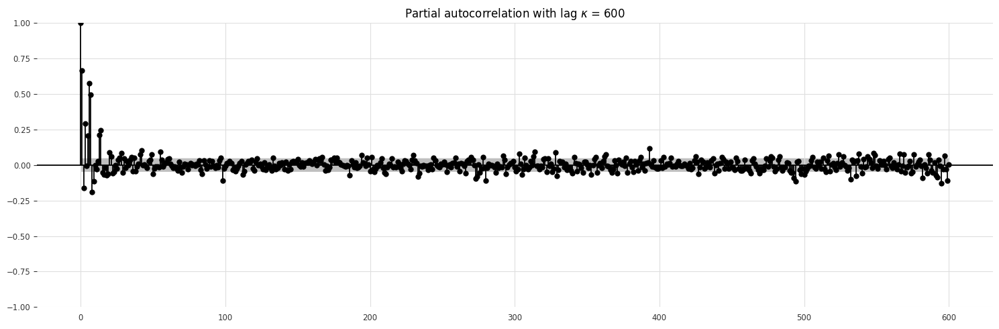

In [115]:
from statsmodels.graphics.tsaplots import plot_pacf
#plot_pacf(top_series['44 BEVERAGES'], m=500, max_lag=600)
fig, ax = plt.subplots(figsize=(15, 5))
plot_pacf(x=top_series['44 BEVERAGES'], ax=ax, lags=600, alpha=0.05)
plt.title(r'Partial autocorrelation with lag $\kappa$ = 600')
plt.tight_layout()
plt.show()

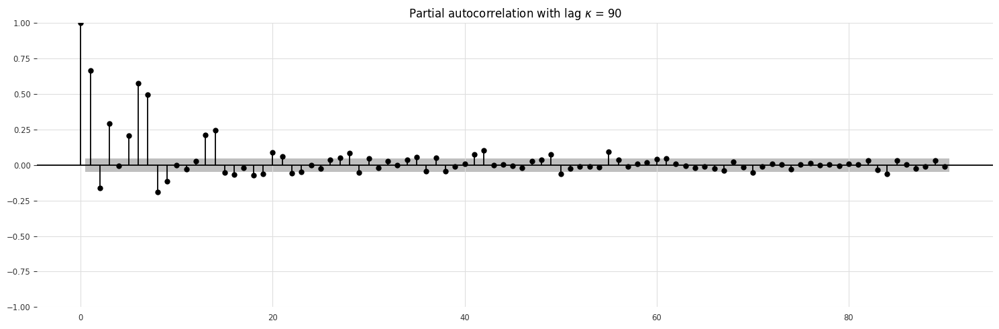

In [116]:
fig, ax = plt.subplots(figsize=(15, 5))
plot_pacf(x=top_series['44 BEVERAGES'], ax=ax, lags=90, alpha=0.05)
plt.title(r'Partial autocorrelation with lag $\kappa$ = 90')
plt.tight_layout()
plt.show()

anche la correlazione parziale mostra l'andamento ricorrente = stagionalità settimanale del fenomeno delle vendite

In [117]:
series = TimeSeries.from_dataframe(df=top_series, value_cols='44 BEVERAGES', freq='D', fill_missing_dates=True) #hierarchy=hierarchy)
series
#from_dataframe(df, time_col=None, value_cols=None, fill_missing_dates=False, freq=None, fillna_value=None, static_covariates=None, hierarchy=None)

<TimeSeries (DataArray) (date: 1688, component: 1, sample: 1)>
array([[[    0.]],

       [[ 5466.]],

       [[ 3718.]],

       ...,

       [[10491.]],

       [[ 7322.]],

       [[ 7351.]]])
Coordinates:
  * date       (date) datetime64[ns] 2013-01-01 2013-01-02 ... 2017-08-15
  * component  (component) object '44 BEVERAGES'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None

In [118]:
transformer = MissingValuesFiller()
series = transformer.transform(series)

In [119]:
for m in range(2, 280):
    is_seasonal, period = check_seasonality(series, m=m, max_lag=320, alpha=0.05) #series['44 BEVERAGES']
    if is_seasonal:
        print("There is seasonality of order {}.".format(period))

There is seasonality of order 7.
There is seasonality of order 14.
There is seasonality of order 21.
There is seasonality of order 28.
There is seasonality of order 35.
There is seasonality of order 42.
There is seasonality of order 49.
There is seasonality of order 56.
There is seasonality of order 63.
There is seasonality of order 70.
There is seasonality of order 77.
There is seasonality of order 84.
There is seasonality of order 91.
There is seasonality of order 98.
There is seasonality of order 105.
There is seasonality of order 112.
There is seasonality of order 119.
There is seasonality of order 126.
There is seasonality of order 133.
There is seasonality of order 140.
There is seasonality of order 147.
There is seasonality of order 154.
There is seasonality of order 161.
There is seasonality of order 168.
There is seasonality of order 175.
There is seasonality of order 182.
There is seasonality of order 189.
There is seasonality of order 196.
There is seasonality of order 203.


**Transactions**

In [235]:
transactions = pd.read_csv("./data/transactions.csv").sort_values(["store_nbr", "date"])

In [236]:
#transactions = pd.read_csv("./data/transactions.csv", index_col='date', parse_dates=True).sort_values(['date', "store_nbr"])

In [237]:
transactions["date"] = pd.to_datetime(transactions.date)

In [238]:
transactions.head(5)

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520


In [239]:
#correlation plot
temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))

Spearman Correlation between Total Sales and Transactions: 0.8175


La correlazione tra il totale delle vendite giornaliere di ogni negozio col totale delle transazioni è di 0.82 circa, si potrebbe utilizzare 'transactions' come covariata.

In [240]:
top_transactions = transactions.loc[transactions['store_nbr'].isin([44, 45])].reset_index(drop=True,).rename_axis('index')#\
                  #.sort_values('transactions', ascending=False)
top_transactions.head(5)

,date,store_nbr,transactions
index,,,
0,2013-01-02,44,4821
1,2013-01-03,44,3618
2,2013-01-04,44,4169
3,2013-01-05,44,4921
4,2013-01-06,44,4925


In [241]:
top_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3354 entries, 0 to 3353
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          3354 non-null   datetime64[ns]
 1   store_nbr     3354 non-null   int64         
 2   transactions  3354 non-null   int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 78.7 KB


In [242]:
# top_transactions = pd.pivot_table(data=top_transactions, index="date", columns=["store_nbr"] , values="transactions")
# top_transactions.columns = top_transactions.columns.map(lambda x: clean_column_name(x))

In [243]:
#top_transactions.to_csv('./data/top_series_transactions.csv')

In [244]:
top_transactions = pd.read_csv('./data/top_series_transactions.csv', index_col='date', parse_dates=True)
top_transactions.head(5)

,44,45
date,,
2013-01-02,4821,4208
2013-01-03,3618,3314
2013-01-04,4169,3630
2013-01-05,4921,4331
2013-01-06,4925,4418


In [114]:
#top_transactions.to_csv('./data/top_series_transactions.csv')
#top_transactions = pd.read_csv("./data/top_series_transactions.csv", index_col='index')
#top_transactions.head(5)

,date,store_nbr,transactions
index,,,
0,2013-01-02,44,4821
1,2013-01-03,44,3618
2,2013-01-04,44,4169
3,2013-01-05,44,4921
4,2013-01-06,44,4925


In [175]:
#top_transactions = pd.read_csv("./data/top_series_transactions.csv", index_col='date')
#top_transactions.head(5)

,index,store_nbr,transactions
date,,,
2013-01-02,0,44,4821
2013-01-03,1,44,3618
2013-01-04,2,44,4169
2013-01-05,3,44,4921
2013-01-06,4,44,4925


Il numero più alto di transazioni si è verificato il 23 dicembre di ogni anno, poco prima di Natale

In [187]:
top_transactions.columns

Index(['44', '45'], dtype='object')

In [116]:
#top_transactions = transactions.loc[transactions['store_nbr'].isin([44, 45])]

In [188]:
import plotly.express as px
px.line(top_transactions, x=top_transactions.index, y=top_transactions.columns, title="Transactions")

In [198]:
#transaction boxplot
a = top_transactions.copy()
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y=top_transactions.columns , color="month", title="Transactions")

In [197]:
top_transactions.head(1)

,44,45
date,,
2013-01-02,4821,4208


In [199]:
#monthly average transaction
a = top_transactions.copy()
a = top_transactions.resample("M").mean()
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
px.line(a, x='date', y=top_transactions.columns, color='year', title="Monthly Average Transactions")

A dicembre il numero medio delle transazioni aumenta del 30% circa

In [217]:
#day of week average transactions per year
a = top_transactions.copy()
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
a = a.groupby(["year", "dayofweek"])['44','45'].mean().reset_index()
px.line(a, x="dayofweek", y=top_transactions.columns[0], color="year", title="{} Transactions".format(top_transactions.columns[0]))

In [218]:
px.line(a, x="dayofweek", y=top_transactions.columns[1], color="year", title="{} Transactions".format(top_transactions.columns[1]))

il numero medio di transazioni per ogni giorno della settimana aumenta del 30% circa il venerdì e il sabato

**Prima di rappresentare graficamente le serie e procedere alla previsione di vendita valutiamo se ci sono osservazioni mancanti**

In [2]:
top_series = pd.read_csv('./data/top_series_train.csv')
top_series["date"] = pd.to_datetime(top_series.date)
top_series.set_index(keys='date', inplace=True)
top_series.head(2)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
date,,,,,,
2013-01-01,0.00,0.00,0.00,0.00,0.00,0.00
2013-01-02,5466.00,10686.00,0.00,4070.00,11422.00,0.00


In [3]:
date_index = pd.date_range(start='01/01/2013', end='15/08/2017', freq='D')
df = top_series.reindex(date_index)

In [4]:
df[df['44 BEVERAGES'].isna() == True]

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
2013-12-25,NaN,NaN,NaN,NaN,NaN,NaN
2014-12-25,NaN,NaN,NaN,NaN,NaN,NaN
2015-12-25,NaN,NaN,NaN,NaN,NaN,NaN
2016-12-25,NaN,NaN,NaN,NaN,NaN,NaN


Mancano le osservazioni riferite al 25-12 di ogni anno precedente al 2017, si procede all'inserimento di un valore pari al giorno successivo per tale giorno.

In [5]:
top_series = top_series.reindex(date_index, method='bfill')
top_series[top_series['44 BEVERAGES'].isna() == True]

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE


Sostituiamo i valori pari a '0'

In [6]:
top_series = top_series.replace(to_replace=0, method='bfill')

In [7]:
a = top_series.copy()
a.head(5)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
2013-01-01,5466.00,10686.00,57.00,4070.00,11422.00,47.00
2013-01-02,5466.00,10686.00,57.00,4070.00,11422.00,47.00
2013-01-03,3718.00,7342.00,57.00,2526.00,6841.00,47.00
2013-01-04,4112.00,7250.00,57.00,3064.00,7527.00,47.00
2013-01-05,6458.00,10699.00,57.00,4852.00,10550.00,47.00


In [8]:
same_scale = list(a.columns)
same_scale.remove('45 GROCERY I')
same_scale.remove('44 GROCERY I')
fig = px.line(a, x=a.index, y=same_scale, title='Series of daily total sales',
              width=900, height=450)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales',
    legend_title='Time series')
fig.show()

In [12]:
fig = px.line(a, x=a.index, y=['44 GROCERY I', '45 GROCERY I'], title="Series of daily total sales",
              width=900, height=450)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales',
    legend_title='Time series')
fig.show()

In [9]:
fig = px.line(a, x=a.index, y=['44 BEVERAGES'], title="Example of a non stationary time series",
              width=900, height=450)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales',
    legend_title='Time series')
fig.show()

In [20]:
diff_beverages_44 = a['44 BEVERAGES'].diff(1)[1:]

In [25]:
fig = px.line(x=diff_beverages_44.index, y=diff_beverages_44, title="Example of a stationary time series: differenced 44 BEVERAGES ",
              width=900, height=450)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales',
    legend_title='Time series')
fig.show()

In [10]:
px.line(a, x=a.index, y='45 PRODUCE', title="Daily total sales of {}".format('45 PRODUCE'),
        width=800, height=400)

In [11]:
produce_44 = a['44 PRODUCE']

In [12]:
fig = px.line(x=produce_44['2014-01':'2014-08'].index, y=produce_44['2014-01':'2014-08'], title="Daily total sales of {}".format('44 PRODUCE'),
              width=800, height=400)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales',
    legend_title='Time series')
fig.show()

I balzi sono regolari, all'inizio di ogni mese.

In [13]:
fig = px.line(a, x=a.index, y='44 PRODUCE', title="Daily total sales of {}".format('44 PRODUCE'),
              width=800, height=400)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales',
    legend_title='Time series')
fig.show()

In [14]:
diff_produce_44 = a['44 PRODUCE'].diff(1)[1:]
print(len(diff_produce_44), diff_produce_44[:2])
diff_produce_44_lag1 = diff_produce_44.shift(1)[1:]
print(len(diff_produce_44_lag1), diff_produce_44_lag1[:2])
diff_produce_44 = diff_produce_44[1:]
print(len(diff_produce_44), diff_produce_44[:2])
diff_produce_44_short = diff_produce_44['2015-06-03':]
diff_produce_44_short_lag1 = diff_produce_44_lag1['2015-06-03':]

1687 2013-01-02   0.00
2013-01-03   0.00
Freq: D, Name: 44 PRODUCE, dtype: float64
1686 2013-01-03   0.00
2013-01-04   0.00
Freq: D, Name: 44 PRODUCE, dtype: float64
1686 2013-01-03   0.00
2013-01-04   0.00
Freq: D, Name: 44 PRODUCE, dtype: float64


In [15]:
print(len(diff_produce_44_short))
print(len(diff_produce_44_short_lag1))

805
805


In [16]:
date = pd.to_datetime(diff_produce_44.index).to_series()
year = date.dt.year
month= date.dt.month_name()
fig = px.box(diff_produce_44, x=year, y='44 PRODUCE', color=month, title="Monthly Boxplots of diff. 44 PRODUCE")
fig.update_layout(
    xaxis_title='Monthly boxplots per year',
    yaxis_title='44 PRODUCE Sales differences',
    legend_title='Months',
    width=900, height=450)
fig.show()

In [17]:
#px.box(diff_produce_44, y='44 PRODUCE', title="44 PRODUCE sales")

In [18]:
#px.box(diff_produce_44['2015-06-01':], y='44 PRODUCE', title="44 PRODUCE sales from June 2015")

In [19]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.add_trace(
    go.Box(y=diff_produce_44, name='Differenced 44 PRODUCE', marker_color='red'),
    row=1, col=1
)

fig.add_trace(
    go.Box(y=diff_produce_44_short, name='Diff. 44 PRODUCE short series', marker_color='lightseagreen'),
    row=1, col=2
)

fig.update_layout(xaxis_title='Time series', yaxis_title='Sales difference', height=500, width=750,
                  title_text="Boxplots of differenced 44 PRODUCE")
fig.show()

In [25]:
colors = {'44 BEVERAGES':'blue', '44 GROCERY I':'red', '44 PRODUCE':'green',
          '45 BEVERAGES':'purple', '45 GROCERY I':'orange', '45 PRODUCE':'lightblue'}

<Figure size 640x480 with 0 Axes>

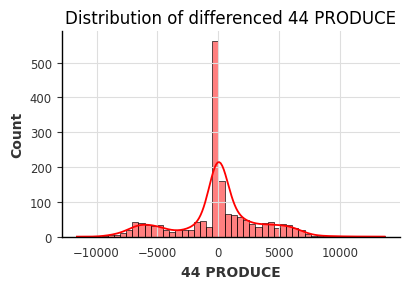

In [23]:
#import seaborn as sns
plt.figure()
sns.displot(x=diff_produce_44, kde=True, bins=50, color='red', height=3, aspect=1.4)
plt.title("Distribution of differenced 44 PRODUCE")
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

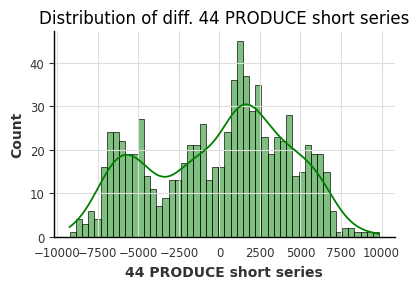

In [26]:
plt.figure()
color = colors['44 PRODUCE']
sns.displot(x=diff_produce_44_short, kde=True, bins=50, color=color, height=3, aspect=1.4)
plt.title("Distribution of diff. 44 PRODUCE short series")
plt.xlabel('44 PRODUCE short series')
plt.tight_layout()
plt.show()

In [23]:
print(diff_produce_44_lag1[:2], diff_produce_44[:2])

2013-01-03   0.00
2013-01-04   0.00
Freq: D, Name: 44 PRODUCE, dtype: float64 2013-01-03   0.00
2013-01-04   0.00
Freq: D, Name: 44 PRODUCE, dtype: float64


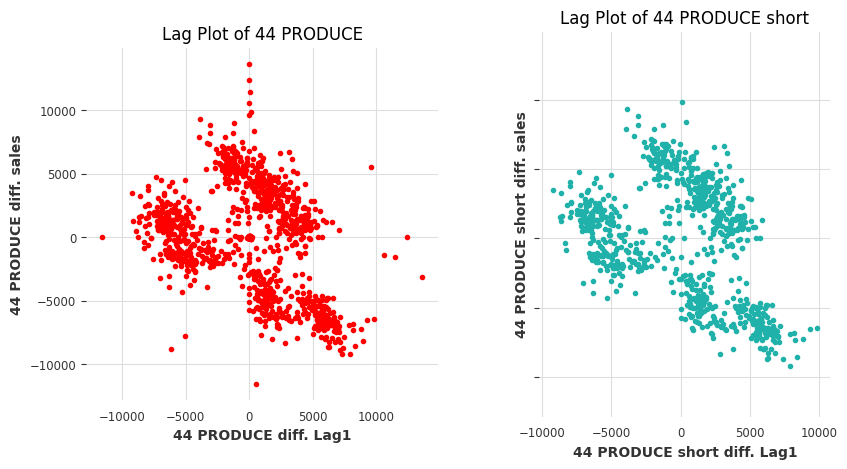

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
ax[0].plot(diff_produce_44_lag1, diff_produce_44, '.', color='red')
ax[0].set_aspect('equal')
ax[0].set_ylabel('44 PRODUCE diff. sales')
ax[0].set_xlabel('44 PRODUCE diff. Lag1')
ax[0].set_title('Lag Plot of 44 PRODUCE');

ax[1].plot(diff_produce_44_short_lag1, diff_produce_44_short, '.', color='lightseagreen')
ax[1].set_aspect('equal')
ax[1].set_ylabel('44 PRODUCE short diff. sales')
ax[1].set_xlabel('44 PRODUCE short diff. Lag1')
ax[1].set_title('Lag Plot of 44 PRODUCE short');

In [25]:
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.add_trace(
    go.Scatter(x=diff_produce_44_lag1, y=diff_produce_44, name='Diff. 44 PRODUCE vs Lag1', mode='markers',
               marker_color='red'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=diff_produce_44_short_lag1, y=diff_produce_44_short, name='Diff. 44 PRODUCE Short vs Lag1',
               mode='markers', marker_color='lightseagreen'),
    row=1, col=2
)

fig.update_layout(xaxis_title='Lag1 sales', yaxis_title='Sales differences', height=500, width=1000,
                  title_text="Scatterplots of diff. 44 PRODUCE vs lag1")
fig.show()

In [26]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(
    go.Scatter(x=diff_produce_44_lag1, y=diff_produce_44, name='Diff. 44 PRODUCE vs Lag1', mode='markers',
               marker_color='red'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=diff_produce_44_short_lag1, y=diff_produce_44_short, name='Diff. 44 PRODUCE Short vs Lag1',
               mode='markers', marker_color='lightseagreen'),
    row=1, col=1
)

fig.update_layout(xaxis_title='Lag1 sales differences', yaxis_title='Sales differences', height=500, width=800,
                  title_text="Scatterplots of diff. 44 PRODUCE vs lag1")
fig.show()

In [27]:
#px.scatter(x=diff_produce_44_lag1, y=diff_produce_44, width=500, height=500)

In [27]:
produce_44 = a['44 PRODUCE']
produce_44_short = produce_44['2015-06-01':]
print(len(produce_44), len(produce_44_short))

1688 807


In [29]:
#px.box(produce_44, y='44 PRODUCE', title="44 PRODUCE sales from June 2015")

In [28]:
date = pd.to_datetime(produce_44.index).to_series()
year = date.dt.year
month= date.dt.month_name()
fig = px.box(produce_44, x=year, y='44 PRODUCE', color=month, title="Monthly Boxplots of 44 PRODUCE")
fig.update_layout(
    xaxis_title='Monthly boxplots per year',
    yaxis_title='44 PRODUCE Sales',
    legend_title='Months',
    width=900, height=450)
fig.show()

In [29]:
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.add_trace(
    go.Box(y=produce_44, name='44 PRODUCE', marker_color='red'),
    row=1, col=1
)

fig.add_trace(
    go.Box(y=produce_44_short, name='44 PRODUCE short series', marker_color='lightseagreen'),
    row=1, col=2
)

fig.update_layout(xaxis_title='Time series', yaxis_title='Sales', height=500, width=750,
                  title_text="Boxplots of 44 PRODUCE")
fig.show()

<Figure size 640x480 with 0 Axes>

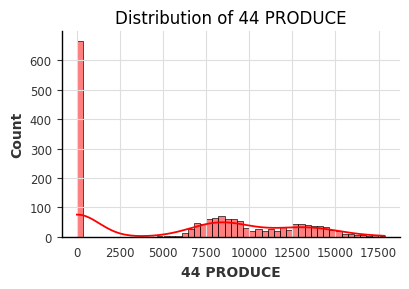

In [30]:
plt.figure()
sns.displot(produce_44, kde=True, bins=50, color='red', height=3, aspect=1.4)
plt.title("Distribution of 44 PRODUCE")
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

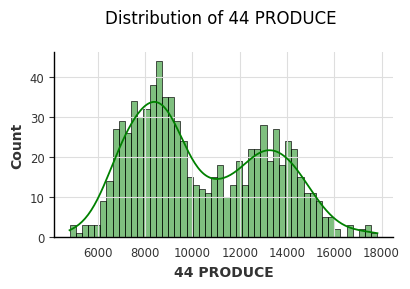

In [32]:
plt.figure()
color = colors['44 PRODUCE']
sns.displot(produce_44_short, kde=True, bins=50, color=color, height=3, aspect=1.4)
plt.title("Distribution of 44 PRODUCE")
plt.tight_layout()
plt.show()

In [33]:
print(len(produce_44))
produce_44_lag1 = produce_44.shift(1)[1:]
#print(len(produce_44_lag1))
#print(produce_44_lag1[:2])
produce_44_short_lag1 = produce_44_short.shift(1)[1:]
# print(len(produce_44_short_lag1))
# print(produce_44_short_lag1[:2])

1688


In [34]:
fig = make_subplots(rows=1, cols=1)

fig.add_trace(
    go.Scatter(x=produce_44_lag1, y=produce_44[1:], name='44 PRODUCE vs Lag1', mode='markers',
               marker_color='red'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=produce_44_short_lag1, y=produce_44_short[1:], name='44 PRODUCE Short vs Lag1',
               mode='markers', marker_color='lightseagreen'),
    row=1, col=1
)

fig.update_layout(xaxis_title='Lag1 sales', yaxis_title='Sales', height=500, width=650,
                  title_text="Scatterplots of 44 PRODUCE vs lag1")
fig.show()

In [35]:
produce_45 = a['45 PRODUCE']
produce_45_short = produce_45['2015-06-01':]
print(len(produce_45), len(produce_45_short))

1688 807


In [39]:
produce_45_short_diff = produce_45_short.diff(1)[1:]
produce_45_short_diff[:2]

2015-06-02   -874.38
2015-06-03   3176.57
Freq: D, Name: 45 PRODUCE, dtype: float64

<Figure size 640x480 with 0 Axes>

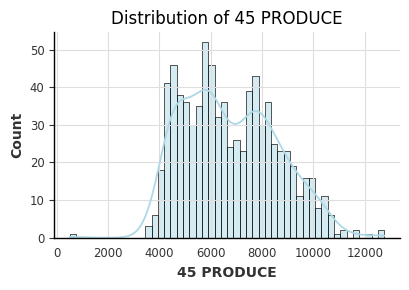

In [38]:
plt.figure()
color = colors['45 PRODUCE']
sns.displot(produce_45_short, kde=True, bins=50, color=color, height=3, aspect=1.4)
plt.title("Distribution of 45 PRODUCE")
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

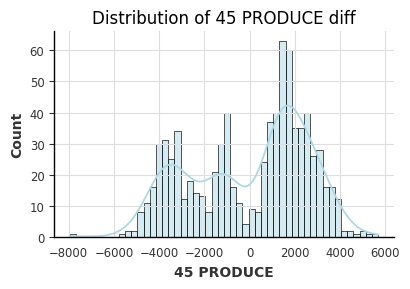

In [40]:
plt.figure()
color = colors['45 PRODUCE']
sns.displot(produce_45_short_diff, kde=True, bins=50, color=color, height=3, aspect=1.4)
plt.title("Distribution of 45 PRODUCE diff")
plt.tight_layout()
plt.show()

In [36]:
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.add_trace(
    go.Box(y=produce_45, name='45 PRODUCE', marker_color='red'),
    row=1, col=1
)

fig.add_trace(
    go.Box(y=produce_45_short, name='45 PRODUCE short series', marker_color='lightseagreen'),
    row=1, col=2
)

fig.update_layout(xaxis_title='Time series', yaxis_title='Sales', height=500, width=750,
                  title_text="Boxplots of 45 PRODUCE")
fig.show()

In [37]:
px.line(x=produce_45_short.index, y=produce_45_short, title="Daily total sales of {}".format('45 PRODUCE'),
        width=800, height=400)

In [39]:
#px.line(a, x=a.index, y='44 BEVERAGES', title="Daily total sales of {}".format('44 BEVERAGES'))

In [40]:
#px.line(a, x=a.index, y='45 BEVERAGES', title="Daily total sales of {}".format('45 BEVERAGES'))

In [41]:
#px.line(a, x=a.index, y='44 GROCERY I', title="Daily total sales of {}".format('44 GROCERY I'))

In [42]:
#px.line(a, x=a.index, y='45 GROCERY I', title="Daily total sales of {}".format('45 GROCERY I'))

In [43]:
top_series.columns

Index(['44 BEVERAGES', '44 GROCERY I', '44 PRODUCE', '45 BEVERAGES',
       '45 GROCERY I', '45 PRODUCE'],
      dtype='object')

In [24]:
colors = {'44 BEVERAGES':'blue', '44 GROCERY I':'red', '44 PRODUCE':'green',
          '45 BEVERAGES':'purple', '45 GROCERY I':'orange', '45 PRODUCE':'lightblue'}

<Figure size 640x480 with 0 Axes>

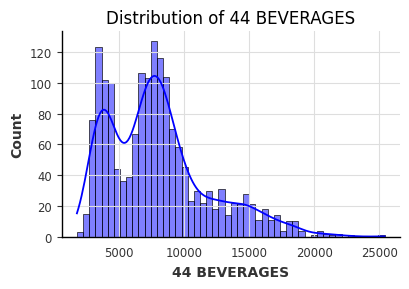

<Figure size 640x480 with 0 Axes>

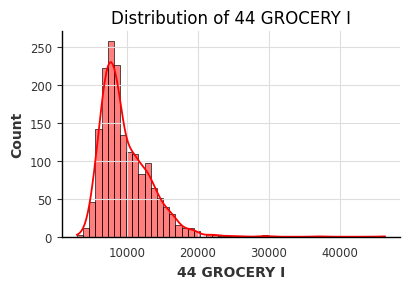

<Figure size 640x480 with 0 Axes>

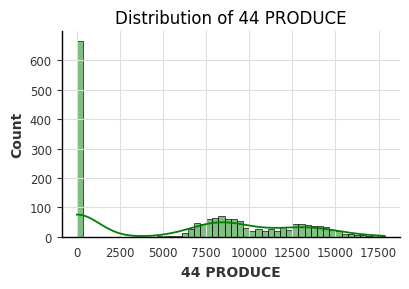

<Figure size 640x480 with 0 Axes>

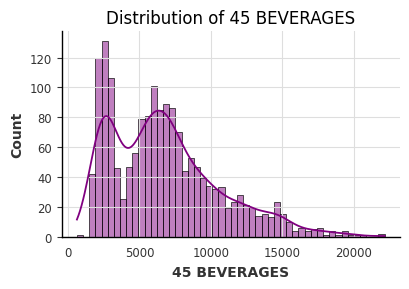

<Figure size 640x480 with 0 Axes>

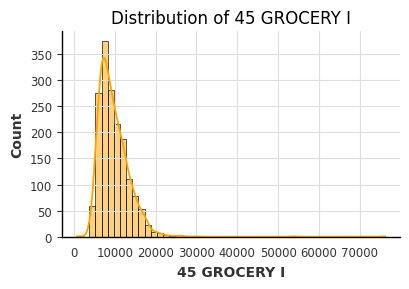

<Figure size 640x480 with 0 Axes>

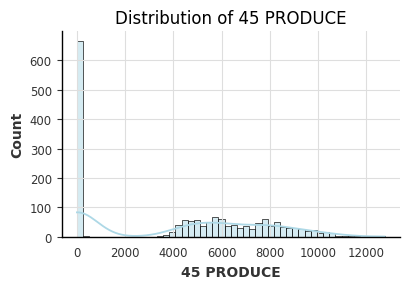

In [45]:
for series in top_series.columns:
    color = colors[series]
    plt.figure()
    sns.displot(top_series[series], kde=True, bins=50, color=color, height=3, aspect=1.4)
    plt.title("Distribution of {}".format(series))
    plt.tight_layout()
    plt.show()

In [46]:
beverages = [s for s in top_series.columns if 'BEVERAGES' in s]
produce = [s for s in top_series.columns if 'PRODUCE' in s]
grocery = [s for s in top_series.columns if 'GROCERY' in s]

In [47]:
same_lenght_series = beverages + grocery
same_lenght_series

['44 BEVERAGES', '45 BEVERAGES', '44 GROCERY I', '45 GROCERY I']

In [48]:
#Monthly sales boxplot
a = top_series.copy()
a["date"] = pd.to_datetime(a.index)
fig = px.box(a, y=same_lenght_series, title="Boxplots of sales")
fig.update_layout(xaxis_title='Series', yaxis_title='Sales', height=500, width=750)
fig.show()

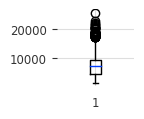

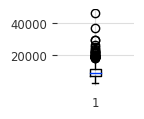

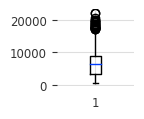

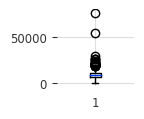

In [106]:
upper_values = {}
a = top_series.copy()
for series in a.columns:
    if 'PRODUCE' not in series:
        plt.figure(figsize=(1,1))
        boxplot = plt.boxplot(a[series])
        top_whisker = [item.get_ydata()[1] for item in boxplot['whiskers']]
        upper_values[series] = top_whisker[1]

In [107]:
upper_values

{'44 BEVERAGES': 17039.0,
 '44 GROCERY I': 18122.0,
 '45 BEVERAGES': 16802.0,
 '45 GROCERY I': 18470.0}

In [108]:
b = top_series.copy()
for series in a.columns:
    if 'PRODUCE' not in series:
        mask = b[series] > upper_values[series]
        b[series][mask] = upper_values[series]

In [48]:
#b.to_csv('./data/top_series_no_outliers.csv')

In [109]:
b.head(1)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
2013-01-01,5466.00,10686.00,57.00,4070.00,11422.00,47.00


<Figure size 640x480 with 0 Axes>

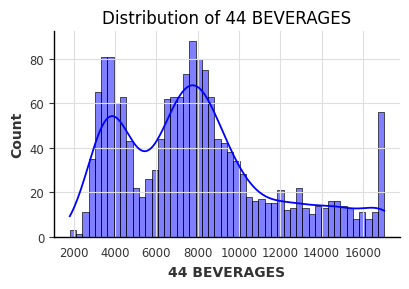

<Figure size 640x480 with 0 Axes>

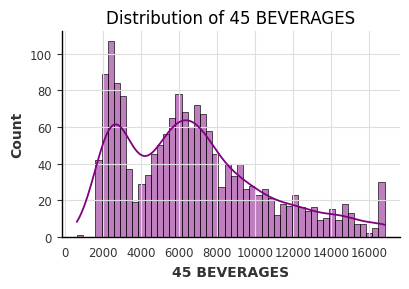

<Figure size 640x480 with 0 Axes>

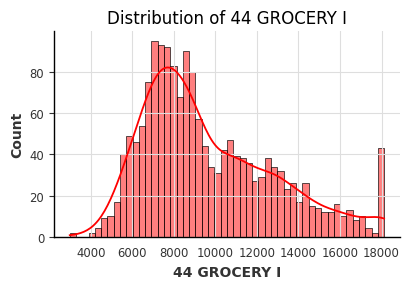

<Figure size 640x480 with 0 Axes>

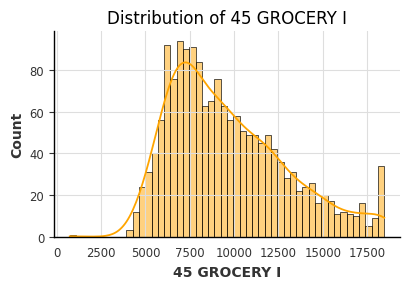

In [54]:
for series in same_lenght_series:
    color = colors[series]
    plt.figure()
    sns.displot(b[series], kde=True, bins=50, color=color, height=3, aspect=1.4)
    plt.title("Distribution of {}".format(series))
    plt.tight_layout()
    plt.show()

<Figure size 640x480 with 0 Axes>

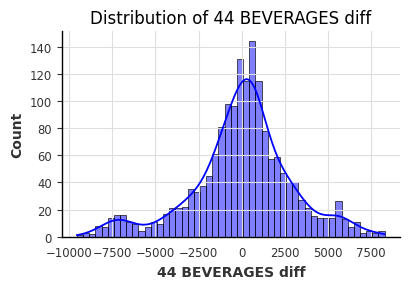

<Figure size 640x480 with 0 Axes>

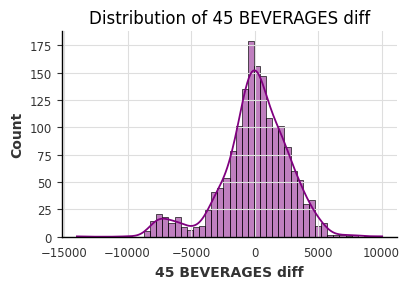

<Figure size 640x480 with 0 Axes>

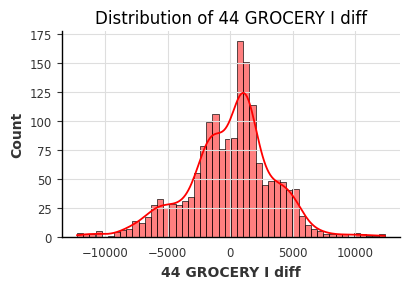

<Figure size 640x480 with 0 Axes>

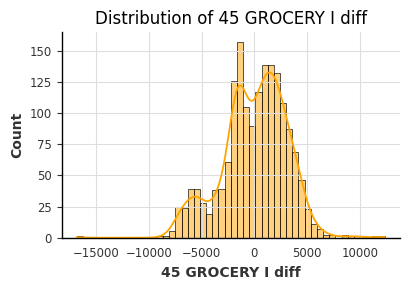

In [55]:
a = b.copy()
for series in same_lenght_series:
    a['{} diff'.format(series)] = a[series].diff(1)
for series in same_lenght_series:
    color = colors[series]
    plt.figure()
    diff = '{} diff'.format(series)
    sns.displot(a[diff], kde=True, bins=50, color=color, height=3, aspect=1.4)
    plt.title("Distribution of {}".format(diff))
    plt.tight_layout()
    plt.show()

In [56]:
a = b.copy()
a["date"] = pd.to_datetime(a.index)
fig = px.box(a, y=same_lenght_series, title="Boxplots of sales")
fig.update_layout(xaxis_title='Series', yaxis_title='Sales', height=500, width=750)
fig.show()

In [57]:
# for series in b.columns:
#     if 'PRODUCE' not in series:
#         plt.figure(figsize=(2,2))
#         boxplot = plt.boxplot(b[series])

In [58]:
#Monthly sales boxplot
a = top_series.copy()
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month_name()
fig = px.box(a, x="year", y=top_series.columns[0] , color="month", title="Monthly Boxplots of {} sales".format(top_series.columns[0]))
fig.update_layout(xaxis_title='Year', yaxis_title='Sales', height=500, width=950)
fig.show()

In [59]:
upper_values

{'44 BEVERAGES': 17039.0,
 '44 GROCERY I': 18122.0,
 '45 BEVERAGES': 16802.0,
 '45 GROCERY I': 18470.0}

In [60]:
#Monthly sales boxplot
a = top_series.copy()
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month_name()
fig = px.box(a, x="month", y=beverages, color='month', title="Monthly boxplots of BEVERAGES sales")
fig.update_layout(xaxis_title='Month of year', yaxis_title='Sales', height=500, width=950)
fig.show()

In [62]:
a = b.copy()
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month_name()
fig = px.box(a, x="month", y=beverages, color='month', title="Removed outliers. Monthly boxplots of BEVERAGES sales")
fig.update_layout(xaxis_title='Month of year', yaxis_title='Sales', height=500, width=950)
fig.show()

In [66]:
#Monthly sales boxplot
a = top_series.copy()
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month_name()
fig = px.box(a, x="month", y=grocery, color='month', title="Monthly boxplots of GROCERY sales")
fig.update_layout(xaxis_title='Month of year', yaxis_title='Sales', height=500, width=950)
fig.show()

In [67]:
a = b.copy()
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month_name()
fig = px.box(a, x="month", y=grocery, color='month', title="Removed Outliers. Monthly boxplots of GROCERY sales")
fig.update_layout(xaxis_title='Month of year', yaxis_title='Sales', height=500, width=950)
fig.show()

In [68]:
#Monthly sales boxplot
a = top_series.copy()
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month_name()
fig = px.box(a, x="month", y=produce, color='month', title="Monthly boxplots of PRODUCE sales")
fig.update_layout(xaxis_title='Month of year', yaxis_title='Sales', height=500, width=950)
fig.show()

In [69]:
a = produce_44_short.copy().to_frame()
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month_name()
fig = px.box(a, x="month", y=produce_44_short, color='month', title="Monthly boxplots of 44 PRODUCE short series sales")
fig.update_layout(xaxis_title='Month of year', yaxis_title='Sales', height=500, width=950)
fig.show()

In [70]:
#a = top_series.copy()
a = b.copy()
a = a.resample("Y").mean()
a.head(5)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
2013-12-31,4276.67,8296.03,33.72,3106.55,7770.58,27.36
2014-12-31,7692.27,9434.92,6464.06,6133.55,8912.87,4107.58
2015-12-31,8095.58,9681.44,6236.63,6783.66,9789.00,3926.68
2016-12-31,9963.27,10582.45,10300.83,8968.72,10810.53,6725.40
2017-12-31,10811.04,10894.32,10252.37,10067.15,11820.36,6912.85


In [71]:
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
#print(a.head(5))
fig = px.line(a, x='date', y=top_series.columns, title='Yearly average sales')
fig.update_layout(xaxis_title='Year', yaxis_title='Average sales', height=500, width=700,)
fig.show()

In [72]:
a = top_series.copy()
a = a.resample("M").mean()
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
fig = px.line(a, x='date', y=top_series.columns, title='Monthly average sales per year') # color='year'
fig.update_layout(xaxis_title='Month per year', yaxis_title='Average sales', height=500, width=900)
fig.show()

In [73]:
same_lenght_series

['44 BEVERAGES', '45 BEVERAGES', '44 GROCERY I', '45 GROCERY I']

In [74]:
a = b.copy()
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month
a = a.groupby(['month']).mean().reset_index()
a.head(5)
fig = px.line(a, x='month', y=same_lenght_series, title='Monthly average sales')
fig.update_layout(xaxis_title='Month of year', yaxis_title='Average sales', height=500, width=900)
fig.show()

In [75]:
a = b.copy()
a = a.loc['2015-06-01':, a.columns.isin(['44 PRODUCE', '45 PRODUCE'])]
a.head(2)
a["date"] = pd.to_datetime(a.index)
a["month"] = a.date.dt.month
a = a.groupby(['month']).mean().reset_index()
a.head(5)
fig = px.line(a, x='month', y=['44 PRODUCE', '45 PRODUCE'], title='Monthly average sales of PRODUCE short series')
fig.update_layout(xaxis_title='Month of year', yaxis_title='Average sales', height=500, width=900)
fig.show()

In [76]:
top_series.head(5)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
2013-01-01,5466.00,10686.00,57.00,4070.00,11422.00,47.00
2013-01-02,5466.00,10686.00,57.00,4070.00,11422.00,47.00
2013-01-03,3718.00,7342.00,57.00,2526.00,6841.00,47.00
2013-01-04,4112.00,7250.00,57.00,3064.00,7527.00,47.00
2013-01-05,6458.00,10699.00,57.00,4852.00,10550.00,47.00


In [77]:
#day of week average transactions
#a = top_series.copy()
a = b.copy()
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
#a["dayofweek"] = a.date.dt.day_name()
a = a.groupby(["dayofweek"]).mean().reset_index()
px.line(a, x="dayofweek", y=same_scale, title="Avg day of week sales")

In [70]:
produce

['44 PRODUCE', '45 PRODUCE']

In [78]:
a = b.copy()
a = a.loc['2015-06-01':, a.columns.isin(['44 PRODUCE', '45 PRODUCE'])]
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
#a["dayofweek"] = a.date.dt.day_name()
a = a.groupby(["dayofweek"]).mean().reset_index()
px.line(a, x="dayofweek", y=produce, title="Avg day of week sales")

In [50]:
#a = top_series.copy()
a = b.copy()
a["date"] = pd.to_datetime(a.index)
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
#a["dayofweek"] = a.date.dt.day_name()
a = a.groupby(["year", "dayofweek"]).mean().reset_index()
fig = px.line(a, x="dayofweek", y=top_series.columns[0], color='year', title="44 BEVERAGES Avg day of week sales per year")
fig.update_layout(xaxis_title='Day of Week', yaxis_title='Average sales', height=500, width=900)
fig.show()

**TEST STAZIONARIETA'**

In [135]:
b.columns

Index(['44 BEVERAGES', '44 GROCERY I', '44 PRODUCE', '45 BEVERAGES',
       '45 GROCERY I', '45 PRODUCE'],
      dtype='object')

In [136]:
test_results = {}
test_results['Test'] = ['ADF', 'KPSS']
for series in b.columns:
    test_results[series] = []
    if 'PRODUCE' in series:
        short_series = b[series]['2015-06-01':]
        print(len(short_series), series)
        adf_results = adf_test(short_series)
        kpss_results = kpss_test(short_series)
        print(kpss_results)
        test_results[series].append('stationary' if adf_results['Test Statistic'] < adf_results['Critical Value (1%)'] else 'non stationary')
        test_results[series].append('stationary' if kpss_results['Test Statistic'] < kpss_results['Critical Value (1%)'] else 'non stationary')
    else:
        adf_results = adf_test(b[series])
        kpss_results = kpss_test(b[series])
        print(series)
        #print(kpss_results['Test Statistic'], kpss_results['Critical Value (1%)'])
        print(adf_results)
        test_results[series].append('stationary' if adf_results['Test Statistic'] < adf_results['Critical Value (1%)'] else 'non stationary')
        test_results[series].append('stationary' if kpss_results['Test Statistic'] < kpss_results['Critical Value (1%)'] else 'non stationary')
stationarity_df = pd.DataFrame.from_dict(data=test_results)

Results of Dickey-Fuller Test:
Results of KPSS Test:
44 BEVERAGES
Test Statistic                  -1.97
p-value                          0.30
#Lags Used                     364.00
Number of Observations Used   1323.00
Critical Value (1%)             -3.44
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Results of Dickey-Fuller Test:
Results of KPSS Test:
44 GROCERY I
Test Statistic                  -0.63
p-value                          0.86
#Lags Used                     370.00
Number of Observations Used   1317.00
Critical Value (1%)             -3.44
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
807 44 PRODUCE
Results of Dickey-Fuller Test:
Results of KPSS Test:
Test Statistic           0.45
p-value                  0.05
#Lags Used              15.00
Critical Value (10%)     0.35
Critical Value (5%)      0.46
Critical Value (2.5%)    0.57
Critical Value (1%)      0.74
dtype: float64
Results of Di

In [137]:
stationarity_df

,Test,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
0,ADF,non stationary,non stationary,non stationary,non stationary,non stationary,non stationary
1,KPSS,non stationary,non stationary,stationary,non stationary,non stationary,stationary


<AxesSubplot: >

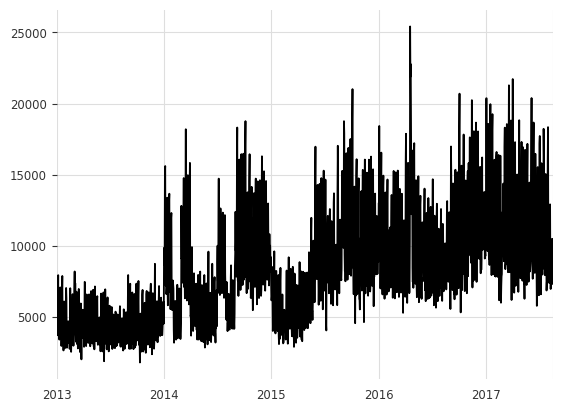

In [78]:
b['44 BEVERAGES'].plot()

<AxesSubplot: >

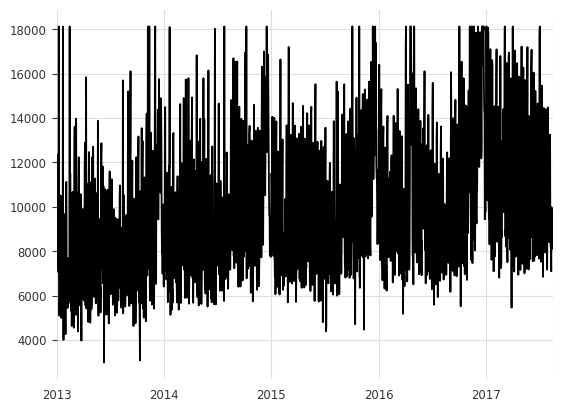

In [74]:
b['44 GROCERY I'].plot()

In [138]:
diff_series_dict = {}
for series in b.columns:
    diff_series_dict[series] = b[series].diff(7)[7:]
diff_series_df = pd.DataFrame.from_dict(data=diff_series_dict)
diff_series_df.head(2)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
2013-01-08,-1763.00,7436.00,0.00,-1747.00,-5970.00,0.00
2013-01-09,-1354.00,-3140.00,0.00,-1284.00,-5702.00,0.00


<AxesSubplot: >

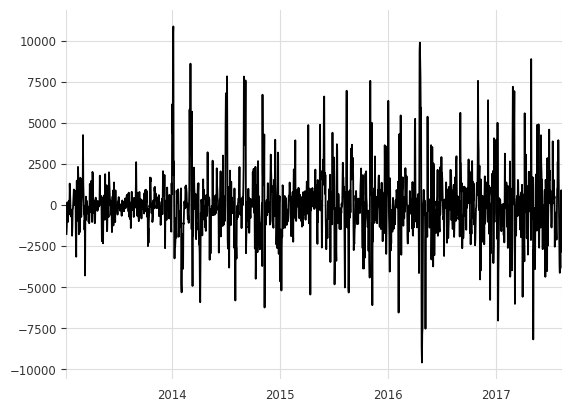

In [139]:
diff_series_df['44 BEVERAGES'].plot()

<Figure size 640x480 with 0 Axes>

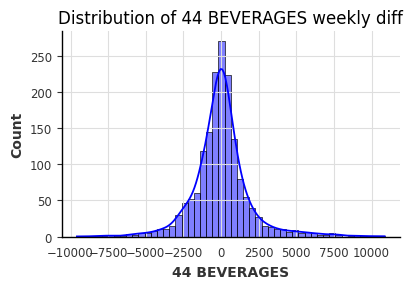

<Figure size 640x480 with 0 Axes>

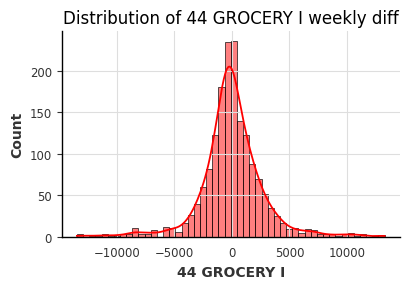

<Figure size 640x480 with 0 Axes>

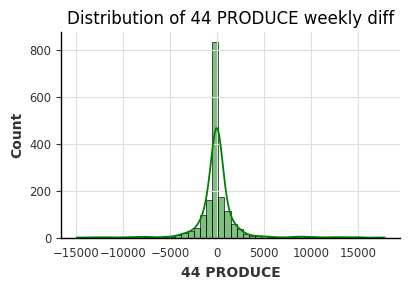

<Figure size 640x480 with 0 Axes>

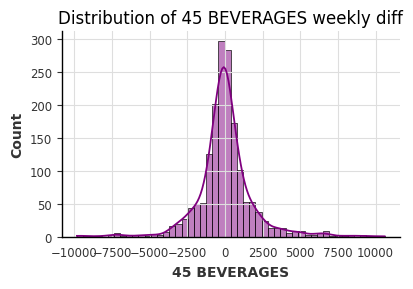

<Figure size 640x480 with 0 Axes>

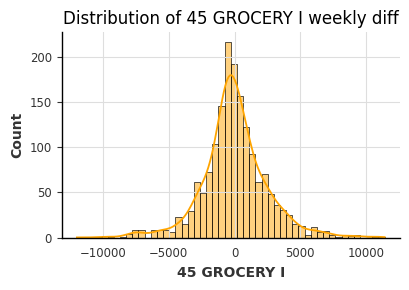

<Figure size 640x480 with 0 Axes>

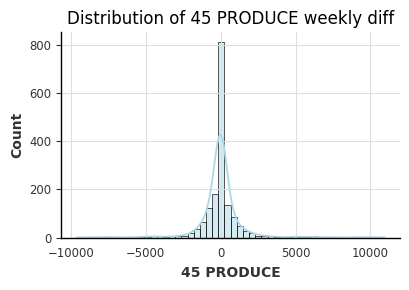

In [141]:
for series in diff_series_df.columns:
    color = colors[series]
    plt.figure()
    sns.displot(diff_series_df[series], kde=True, bins=50, color=color, height=3, aspect=1.4)
    plt.title("Distribution of {} weekly diff".format(series))
    plt.tight_layout()
    plt.show()

In [127]:
def adf_test(timeseries):
    """
    Takes a Pandas Series as input and calculate its ADF test values.

    Parameters
    ----------
    timeseries: Pandas Series 

    Returns
    -------
    None

    """
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, regression='c', autolag='t-stat', maxlag=None)
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

In [130]:
test_results_diff = {}
test_results_diff['Test'] = ['ADF', 'KPSS']
for series in diff_series_df.columns:
    test_results_diff[series] = []
    if 'PRODUCE' in series:
        short_series = diff_series_df[series]['2015-06-01':]
        print(len(short_series), series)
        adf_results = adf_test(short_series)
        kpss_results = kpss_test(short_series)
        print(kpss_results)
        test_results_diff[series].append('stationary' if adf_results['Test Statistic'] < adf_results['Critical Value (1%)'] else 'non stationary')
        test_results_diff[series].append('stationary' if kpss_results['Test Statistic'] < kpss_results['Critical Value (1%)'] else 'non stationary')
    else:
        adf_results = adf_test(diff_series_df[series])
        kpss_results = kpss_test(diff_series_df[series])
        print(series)
        #print(kpss_results['Test Statistic'], kpss_results['Critical Value (1%)'])
        print(adf_results)
        test_results_diff[series].append('stationary' if adf_results['Test Statistic'] < adf_results['Critical Value (1%)'] else 'non stationary')
        test_results_diff[series].append('stationary' if kpss_results['Test Statistic'] < kpss_results['Critical Value (1%)'] else 'non stationary')
stationarity_df_diff = pd.DataFrame.from_dict(data=test_results_diff)

Results of Dickey-Fuller Test:
Results of KPSS Test:
44 BEVERAGES
Test Statistic                  -9.60
p-value                          0.00
#Lags Used                      25.00
Number of Observations Used   1661.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Results of Dickey-Fuller Test:
Results of KPSS Test:
44 GROCERY I
Test Statistic                 -11.63
p-value                          0.00
#Lags Used                      21.00
Number of Observations Used   1665.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
807 44 PRODUCE
Results of Dickey-Fuller Test:
Results of KPSS Test:
Test Statistic           0.23
p-value                  0.10
#Lags Used              20.00
Critical Value (10%)     0.35
Critical Value (5%)      0.46
Critical Value (2.5%)    0.57
Critical Value (1%)      0.74
dtype: float64
Results of Di

In [131]:
stationarity_df_diff

,Test,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
0,ADF,stationary,stationary,stationary,stationary,stationary,stationary
1,KPSS,stationary,stationary,stationary,stationary,stationary,stationary


In [114]:
series_for_corr = b['2015-06-01':]
series_for_corr.head(2)

,44 BEVERAGES,44 GROCERY I,44 PRODUCE,45 BEVERAGES,45 GROCERY I,45 PRODUCE
2015-06-01,9498.00,9633.00,10648.38,9011.00,11532.00,7105.71
2015-06-02,8655.00,8270.00,9254.76,7591.00,9595.00,6231.33


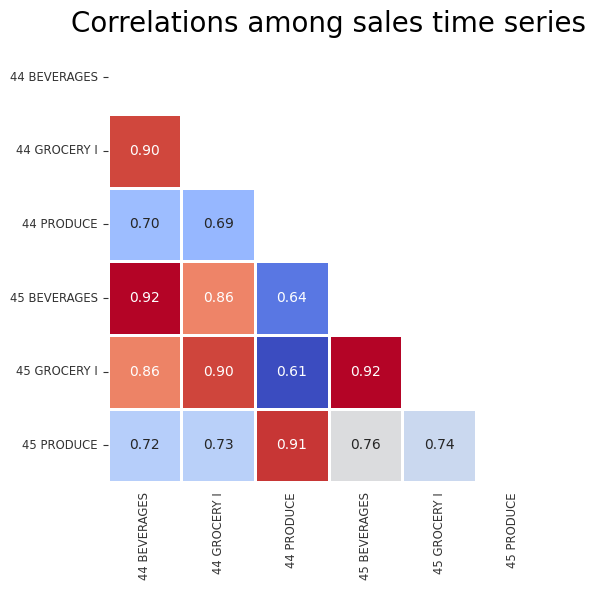

In [115]:
cor = series_for_corr.corr() #tabella a doppia entrata delle correlazioni
mask = np.triu(cor)#.corr())??? #mask è la matrice delle correlazioni
plt.figure(figsize=(6, 6))
sns.heatmap(cor,
        annot=True,
        fmt='.2f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among sales time series", fontsize=20)
plt.tight_layout()
plt.show()

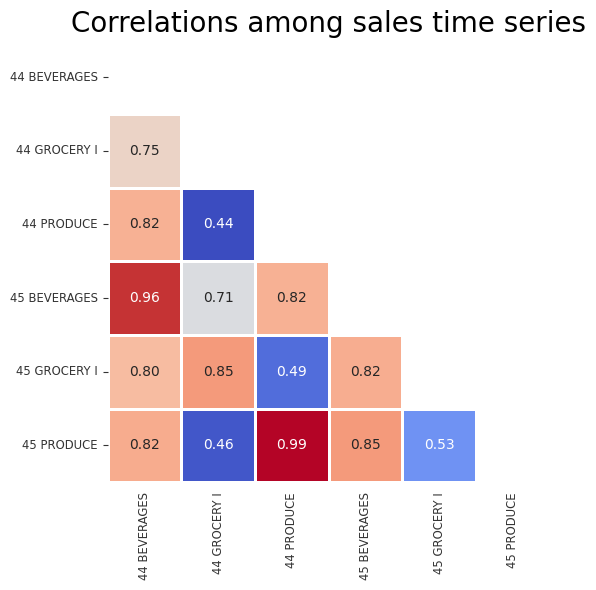

In [113]:
cor = b.corr() #tabella a doppia entrata delle correlazioni
mask = np.triu(cor)#.corr())??? #mask è la matrice delle correlazioni
plt.figure(figsize=(6, 6))
sns.heatmap(cor,
        annot=True,
        fmt='.2f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among sales time series", fontsize=20)
plt.tight_layout()
plt.show()

In [149]:
a = diff_series_df.copy()
a = a[-56:]
series_44 = [c for c in a.columns if '44' in c]
series_45 = [c for c in a.columns if '45' in c]
# for series in diff_series_df.columns:
#     fig, ax = plt.subplots(figsize=(15, 5))
#     diff_series_df[series][-365:].plot(lw=4, ax=ax)
#     plt.title(r'Last year of {} differenced by one day'.format(series))
#     plt.tight_layout()
#     plt.show()
fig = px.line(a, x=a.index, y=series_44, title='Last 8 weeks of differenced series of daily total sales in the store 44',
              width=900, height=450)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales differences',
    legend_title='Time series')
fig.show()

In [150]:
fig = px.line(a, x=a.index, y=series_45, title='Last 8 weeks of differenced series of daily total sales in the store 44',
              width=900, height=450)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales differences',
    legend_title='Time series')
fig.show()

In [152]:
fig = px.line(a, x=a.index, y='45 BEVERAGES', title='Last 12 weeks of differenced series of daily total sales in the store 44',
              width=900, height=450)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales differences',
    legend_title='Time series')
fig.show()